In [1]:
%load_ext autoreload
%autoreload 2
import random
import numpy as np
import torch
import matplotlib.pyplot as plt


In [9]:
import random
import numpy as np
import torch
import matplotlib.pyplot as plt

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

from mixture_lower import Mixture
from guided_models import Diffusion
from chernoff_gpt import ChernoffGuidance

results = {}

# Diffusion parameters
n = T = 20
t_vals = np.arange(1, n+1)
c, delta = 4, 0.02
inner = delta * (1 + c * np.log(n) / n)**t_vals
alpha_t = 1 - (c * np.log(n) / n) * np.minimum(inner, 1)
alpha_t[0] = 1 - delta
d = 2

# Mixture setup
mu_0 = np.array([[5, 0], [-5, 0]])
var_0 = np.eye(d)
pi_0 = np.array([0.95, 0.05])
pi_0 /= np.sum(pi_0)
dist0 = Mixture(mu_0, var_0, pi_0)
diffusion_unguided = Diffusion(dist0, alpha_t, S=50_000)
# X_unguided = diffusion_unguided.calc_samples()
unguided_num_steps = T*50_000

X = diffusion_unguided.calc_samples()



Reverse Diffusion Progress: 100%|██████████| 19/19 [00:23<00:00,  1.22s/it]


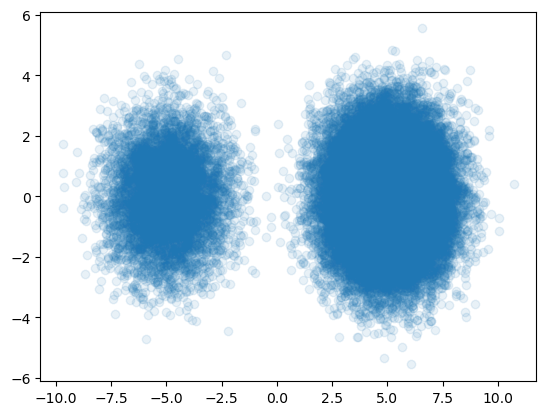

In [10]:
plt.scatter(X[:, -1, 0], X[:, -1, 1], alpha=0.1)

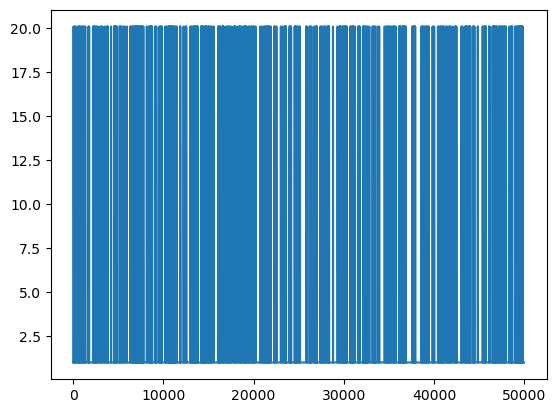

In [11]:
B = 3
def reward_func_hard(x):
    """
    Hard step function for 2D input.
    Returns B when x[..., 0] < -7, and 0 otherwise.
    """
    x0 = np.asarray(x)[..., 0]
    return np.where(x0 < -7, B, 0)

expr = np.exp(reward_func_hard(X[:, -1, :]))
plt.plot(expr)

In [12]:
from value_estimator import ValueEstimate
val_ensemble = ValueEstimate(X, expr, [128, 500, 500])
val_ensemble.train()


Building ValueEstimate...
[Epoch 01] avg MSE: 2.6122
[Epoch 02] avg MSE: 2.4746
[Epoch 03] avg MSE: 2.2995
[Epoch 04] avg MSE: 2.2180
[Epoch 05] avg MSE: 2.1955
[Epoch 06] avg MSE: 2.1838
[Epoch 07] avg MSE: 2.1788
[Epoch 08] avg MSE: 2.1651
[Epoch 09] avg MSE: 2.1619
[Epoch 10] avg MSE: 2.1555
[Epoch 11] avg MSE: 2.1484
[Epoch 12] avg MSE: 2.1458
[Epoch 13] avg MSE: 2.1421
[Epoch 14] avg MSE: 2.1386
[Epoch 15] avg MSE: 2.1321
[Epoch 16] avg MSE: 2.1300
[Epoch 17] avg MSE: 2.1272
[Epoch 18] avg MSE: 2.1230
[Epoch 19] avg MSE: 2.1188
[Epoch 20] avg MSE: 2.1143


2.1142564554439782

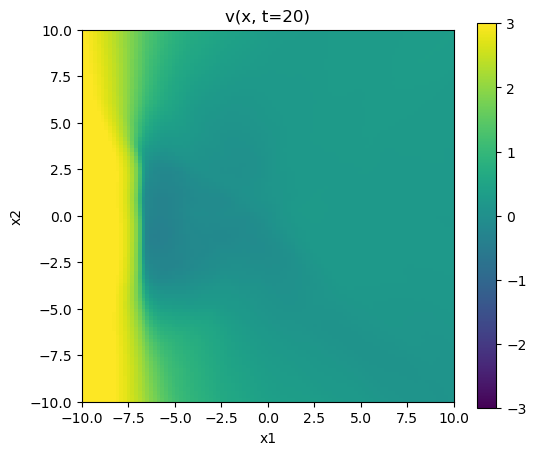

In [14]:
from matplotlib import animation

# Create a grid of x values
x1 = np.linspace(-10, 10, 100)
x2 = np.linspace(-10, 10, 100)
xx1, xx2 = np.meshgrid(x1, x2)
grid_x = np.stack([xx1.ravel(), xx2.ravel()], axis=1)

fig, ax = plt.subplots(figsize=(6, 5))
cax = ax.imshow(np.zeros_like(xx1), extent=[-10, 10, -10, 10], origin='lower', vmin=-B, vmax=B)
plt.xlabel('x1')
plt.ylabel('x2')
plt.title('v(x, t) over time')
cb = fig.colorbar(cax)

t_vals = list(range(1, n + 1))

def animate(t_idx):
    t = t_vals[t_idx]
    t_arr = np.full((grid_x.shape[0],), t)
    v = val_ensemble.predict_under_log(grid_x, t_arr)
    v = np.squeeze(v)
    v_img = v.reshape(xx1.shape)
    cax.set_data(v_img)
    ax.set_title(f'v(x, t={t})')
    return [cax]

ani = animation.FuncAnimation(fig, animate, frames=len(t_vals), interval=100, blit=True)
ani.save('v_under_log_over_time_differentiable.gif', writer='pillow', fps=2)
plt.show()

In [ ]:
chern_lam_20 = ChernoffGuidance(dist0, alpha_t, lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))), iters = 400, lam_lr=0.02, verbose = True)
X_lam_20 = chern_lam_20.train_baselines_and_sample(lam_init = 20)

Chernoff backward:   0%|          | 0/19 [00:00<?, ?it/s]

[loop] t=18 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=18 ...
[train_b] t=18 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.236885 t2=0.290086 t3=0.345388 erm=0.000000 loss=0.398588
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=18:   3%|▎         | 13/400 [00:00<00:13, 29.14it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.040384 t1=0.207440 t2=0.303028 t3=0.344692 erm=0.000000 loss=0.855159
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.082104 t1=-0.271607 t2=0.308172 t3=0.343976 erm=0.000000 loss=0.380541
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=18: 100%|██████████| 400/400 [00:13<00:00, 29.43it/s]


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.1021 lme=-5.383373 base_tau=0.075832 erm=0.000000 tau=0.075832
[loop] t=18 lambda_t=20.102054 tau_t=0.075832
[guide] t=18 K=10000 d=2 tau=0.075832


Chernoff backward:   5%|▌         | 1/19 [00:18<05:39, 18.84s/it]

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.377066 min=-1.908667 max=1.270517
[[0.69458413 0.7013629  0.6887278  ... 0.66296256 0.66247386 0.7326189 ]
 [0.71976894 0.7145013  0.6958832  ... 0.64393324 0.67980576 0.5743555 ]
 [0.7224325  0.74182785 0.7141016  ... 0.6654544  0.6371059  0.73012155]
 ...
 [0.6757751  0.6781063  0.70562184 ... 0.63539654 0.6274709  0.74571776]
 [0.6743811  0.70654684 0.67909676 ... 0.6303363  0.64133847 0.7536987 ]
 [0.7139983  0.71953917 0.7077323  ... 0.641546   0.6498637  0.7585501 ]]
[loop] t=17 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=17 ...
[train_b] t=17 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.242492 t2=0.333950 t3=0.345388 erm=0.000000 loss=0.921830
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.018093 t1=-0.234491 t2=0.298225 t3=0.345076 erm=0.000000 loss=0.408809
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.035692 t1=-0.253225 t2=0.335946 t3=0.344772 erm=0.000000 loss=0.427494
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17: 100%|██████████| 400/400 [00:12<00:00, 31.12it/s]


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(1000

Chernoff backward:  11%|█         | 2/19 [00:36<05:10, 18.29s/it]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.715639 min=-3.433729 max=1.138108
[[0.500816   0.49409103 0.51650417 ... 0.52985686 0.53007936 0.46867433]
 [0.4817244  0.49452034 0.4655613  ... 0.50465924 0.5210638  0.48017442]
 [0.489548   0.48433706 0.51999325 ... 0.4771746  0.5176195  0.4493804 ]
 ...
 [0.5163022  0.48870322 0.5382444  ... 0.49903113 0.51946306 0.4820616 ]
 [0.51515037 0.503906   0.48873484 ... 0.5054075  0.5099243  0.47820136]
 [0.4955665  0.5068507  0.5232205  ... 0.49533036 0.5197289  0.47305208]]
[value_eval] t(array)=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2] -> t_mapped=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.178976 t2=0.297712 t3=0.345388 erm=0.000000 loss=0.464124
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.013338 t1=-0.206480 t2=0.339225 t3=0.345158 erm=0.000000 loss=0.477902
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.025261 t1=0.313905 t2=0.348469 t3=0.344952 erm=0.000000 loss=1.007326
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.038305 t1=0.598706 t2=0.326721 t3=0.344728 erm=0.000000 loss=1.270154
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.053087 t1=-0.190893 t2=0.303064 t3=0.344473 erm=0.000000 loss=0.456644
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=16: 100%|██████████| 400/400 [00:13<00:00, 29.63it/s]


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0667 lme=3.177128 base_tau=0.502569 erm=0.000000 tau=0.502569
[loop] t=16 lambda_t=20.066659 tau_t=0.502569
[guide] t=16 K=10000 d=2 tau=0.502569


Chernoff backward:  16%|█▌        | 3/19 [00:55<04:53, 18.37s/it]

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.788097 min=-4.177743 max=1.369706
[[0.39866722 0.4574589  0.5132066  ... 0.55938786 0.4933336  0.47743666]
 [0.39889792 0.46031508 0.50614107 ... 0.42859608 0.43111786 0.5069249 ]
 [0.41756052 0.48332685 0.46787336 ... 0.44548544 0.4364211  0.49307948]
 ...
 [0.38920853 0.4649459  0.47069064 ... 0.45917845 0.48745805 0.510677  ]
 [0.39810583 0.5044299  0.5103192  ... 0.46093655 0.48641342 0.5011435 ]
 [0.40906107 0.50259095 0.5142693  ... 0.45779723 0.47859934 0.4865431 ]]
[value_eval] t(array)=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.054905 t2=0.296285 t3=0.345388 erm=0.000000 loss=0.696578
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15:  14%|█▍        | 55/400 [00:01<00:11, 29.23it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.008823 t1=-0.107974 t2=0.301657 t3=0.345235 erm=0.000000 loss=0.538919
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.019072 t1=-0.149023 t2=0.317611 t3=0.345059 erm=0.000000 loss=0.513646
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.041754 t1=-0.132355 t2=0.301047 t3=0.344668 erm=0.000000 loss=0.513361
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=15: 100%|██████████| 400/400 [00:12<00:00, 30.94it/s]


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0527 lme=1.227651 base_tau=0.405701 erm=0.000000 tau=0.405701
[loop] t=15 lambda_t=20.052709 tau_t=0.405701
[guide] t=15 K=10000 d=2 tau=0.405701


Chernoff backward:  21%|██        | 4/19 [01:13<04:32, 18.16s/it]

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.678050 min=-3.249575 max=1.370076
[[0.49290133 0.5852452  0.5500223  ... 0.5809943  0.52234447 0.5890042 ]
 [0.49828517 0.5902987  0.60454035 ... 0.5860818  0.40812135 0.56910914]
 [0.5306633  0.5637682  0.58397603 ... 0.5341434  0.45771408 0.59326816]
 ...
 [0.5073976  0.5807164  0.589115   ... 0.56494343 0.5224935  0.53803766]
 [0.4913872  0.5558992  0.6160344  ... 0.5776054  0.43337345 0.54187423]
 [0.61764663 0.5639656  0.6122883  ... 0.52839464 0.4727426  0.5852941 ]]
[value_eval] t(array)=[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4] -> t_map

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.155850 t2=0.293862 t3=0.345388 erm=0.000000 loss=0.795099
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.008041 t1=-0.068505 t2=0.244983 t3=0.345249 erm=0.000000 loss=0.521727
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=14:  52%|█████▏    | 208/400 [00:06<00:06, 31.37it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.022797 t1=-0.003457 t2=0.267256 t3=0.344995 erm=0.000000 loss=0.608793
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=14: 100%|██████████| 400/400 [00:12<00:00, 31.47it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0392 lme=9.704154 base_tau=0.828971 erm=0.000000 tau=0.828971
[loop] t=14 lambda_t=20.039182 tau_t=0.828971
[guide] t=14 K=10000 d=2 tau=0.828971


Chernoff backward:  26%|██▋       | 5/19 [01:30<04:11, 17.98s/it]

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.045291 min=-3.504994 max=0.816463
[[0.32495046 0.45355886 0.36250487 ... 0.40005758 0.20776875 0.41431373]
 [0.38079938 0.4392221  0.37510955 ... 0.43763608 0.2033155  0.34626174]
 [0.37679425 0.40297094 0.347591   ... 0.38856658 0.20767091 0.35823873]
 ...
 [0.3339876  0.40629324 0.37825447 ... 0.41865668 0.1829438  0.40415427]
 [0.32209343 0.44160375 0.3992342  ... 0.38853565 0.2523673  0.3618041 ]
 [0.31996801 0.48701668 0.3649466  ... 0.41779682 0.18439561 0.3763201 ]]
[value_eval] t(array)=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.145104 t2=0.224207 t3=0.345388 erm=0.000000 loss=0.714699
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.013493 t1=0.270120 t2=0.238671 t3=0.345155 erm=0.000000 loss=0.853946
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.021635 t1=0.214203 t2=0.195205 t3=0.345015 erm=0.000000 loss=0.754422
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=13:  72%|███████▏  | 287/400 [00:09<00:03, 31.44it/s]

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=13: 100%|██████████| 400/400 [00:12<00:00, 31.59it/s]


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.

Chernoff backward:  32%|███▏      | 6/19 [01:48<03:52, 17.92s/it]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.396873 min=-3.765177 max=0.383550
[[0.2739702  0.2702928  0.2923254  ... 0.21785223 0.17618175 0.32351458]
 [0.3008514  0.29139867 0.28090242 ... 0.30548847 0.2133905  0.32714784]
 [0.29963288 0.35073987 0.33938947 ... 0.2796683  0.24567427 0.29235122]
 ...
 [0.25756007 0.32552108 0.2983035  ... 0.3076069  0.1813964  0.29203257]
 [0.2513563  0.28199714 0.28106278 ... 0.23201215 0.19433202 0.31185427]
 [0.24644046 0.28189966 0.28365776 ... 0.2189925  0.17933717 0.28148988]]
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(2400, 2) -> v.shape=(2400,)
[guide] active=150 Xprop.shape=(16, 150, 2) v_vals.shape=(16, 150) logu_vals.shape=(150,)
[guide] accept_log_exponent.shape=(16, 150) mean=-1.638124 min

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.216400 t2=0.208508 t3=0.345388 erm=0.000000 loss=0.770297
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=12:  10%|█         | 40/400 [00:01<00:11, 30.48it/s]

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.018776 t1=0.604924 t2=0.213342 t3=0.345064 erm=0.000000 loss=1.163330
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.024750 t1=0.095262 t2=0.226796 t3=0.344961 erm=0.000000 loss=0.667019
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=12: 100%|██████████| 400/400 [00:13<00:00, 30.52it/s]

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0313 lme=2.819971 base_tau=0.485626 erm=0.000000 tau=0.485626
[loop] t=12 lambda_t=20.031299 tau_t=0.485626
[guide] t=12 K=10000 d=2 tau=0.485626


Chernoff backward:  37%|███▋      | 7/19 [02:06<03:36, 18.01s/it]

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.683114 min=-3.014876 max=1.261802
[[0.45199192 0.47948873 0.68975055 ... 0.55829114 0.41106442 0.68470496]
 [0.46996954 0.68083256 0.592161   ... 0.6198788  0.5172685  0.58304125]
 [0.57762444 0.6528823  0.5940041  ... 0.46513417 0.5763338  0.61433464]
 ...
 [0.47702038 0.46856427 0.59995484 ... 0.4871377  0.47973228 0.49030688]
 [0.6245821  0.51451534 0.59015346 ... 0.4675405  0.37704468 0.5575464 ]
 [0.516197   0.4822963  0.637902   ... 0.57948977 0.42321005 0.5298772 ]]
[value_eval] t(array)=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7] -> t_mapped=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.196375 t2=0.221594 t3=0.345388 erm=0.000000 loss=0.763357
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.011580 t1=0.274447 t2=0.222524 t3=0.345188 erm=0.000000 loss=0.842159
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.018053 t1=0.164705 t2=0.221807 t3=0.345076 erm=0.000000 loss=0.731588
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.024658 t1=0.153164 t2=0.229308 t3=0.344962 erm=0.000000 loss=0.727435
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11: 100%|██████████| 400/400 [00:12<00:00, 31.21it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0309 lme=4.952564 base_tau=0.592102 erm=0.000000 tau=0.592102
[loop] t=11 lambda_t=20.030885 tau_t=0.592102
[guide] t=11 K=10000 d=2 tau=0.592102


Chernoff backward:  42%|████▏     | 8/19 [02:24<03:17, 17.91s/it]

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.779610 min=-2.871612 max=0.979159
[[0.51347333 0.49925044 0.44618708 ... 0.6338941  0.34812045 0.337936  ]
 [0.5381156  0.36232394 0.4646225  ... 0.52752936 0.69524395 0.4045325 ]
 [0.4781056  0.51409155 0.64583474 ... 0.47617483 0.36049107 0.5075877 ]
 ...
 [0.5000251  0.36658904 0.50372183 ... 0.49410057 0.6169964  0.3435753 ]
 [0.4898962  0.34462693 0.44980854 ... 0.52041715 0.35257298 0.352098  ]
 [0.51267034 0.35971776 0.5330113  ... 0.48985144 0.37241787 0.5789705 ]]
[value_eval] t(array)=[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8] -> t_map

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.149252 t2=0.203537 t3=0.345388 erm=0.000000 loss=0.698177
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.006210 t1=0.532029 t2=0.236469 t3=0.345281 erm=0.000000 loss=1.113778
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.023718 t1=0.177813 t2=0.255452 t3=0.344979 erm=0.000000 loss=0.778244
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=10: 100%|██████████| 400/400 [00:12<00:00, 31.23it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0295 lme=12.285755 base_tau=0.958261 erm=0.000000 tau=0.958261
[loop] t=10 lambda_t=20.029523 tau_t=0.958261
[guide] t=10 K=10000 d=2 tau=0.958261


Chernoff backward:  47%|████▋     | 9/19 [02:42<02:59, 17.90s/it]

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.202408 min=-4.000137 max=0.530705
[[0.30936757 0.41341814 0.27319723 ... 0.35092315 0.16120528 0.22546834]
 [0.308204   0.31933644 0.25076386 ... 0.2696688  0.1476183  0.21826781]
 [0.3433465  0.33488417 0.26542464 ... 0.30701476 0.18056731 0.2405334 ]
 ...
 [0.30437225 0.2302759  0.295724   ... 0.3025064  0.11858734 0.2710923 ]
 [0.32536355 0.28494763 0.47627586 ... 0.28651005 0.10435519 0.2522026 ]
 [0.32329044 0.25484803 0.4061547  ... 0.3536301  0.12442682 0.23245408]]
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1072, 2) -> v.shape=(1072,)
[guide] active=67 Xprop.shape=(16, 67, 2) v_vals.shape=(16, 67) logu_vals.shape=(67,)
[guide] accept_log_exponent.shape=(16, 67) mean=-1.755068 min=-3.4

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.058323 t2=0.251415 t3=0.345388 erm=0.000000 loss=0.655126
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.007097 t1=-0.063326 t2=0.394066 t3=0.345265 erm=0.000000 loss=0.676006


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.014357 t1=0.257121 t2=0.337181 t3=0.345140 erm=0.000000 loss=0.939442


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.021370 t1=0.009247 t2=0.364471 t3=0.345019 erm=0.000000 loss=0.718737
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.028685 t1=0.171697 t2=0.372077 t3=0.344893 erm=0.000000 loss=0.888667
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9: 100%|██████████| 400/400 [00:13<00:00, 30.03it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0355 lme=22.731007 base_tau=1.479312 erm=0.000000 tau=1.479312
[loop] t=9 lambda_t=20.035501 tau_t=1.479312
[guide] t=9 K=10000 d=2 tau=1.479312
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.768118 min=-5.110867 max=0.146664
[[0.19239537 0.23941414 0.19684617 ... 0.1622536  0.12465471 0.15285392]
 [0.1966132  0.12987813 0.1931753  ... 0.1688401  0.21071163 0.1542622 ]
 [0.19798674 0.17067532 0.20547685 ... 0.17142956 0.1581432  0.19250108]
 ...
 [0.20512311 0.12266046 0.1936184  ... 0.18027054 0.12004816 0.14980201]
 [0.2117291  0.16958305 0.19453256 

Chernoff backward:  53%|█████▎    | 10/19 [03:00<02:43, 18.12s/it]

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(9456, 2) -> v.shape=(9456,)
[guide] active=591 Xprop.shape=(16, 591, 2) v_vals.shape=(16, 591) logu_vals.shape=(591,)
[guide] accept_log_exponent.shape=(16, 591) mean=-2.054200 min=-4.774687 max=0.111823
[[0.20547281 0.14251453 0.01563204 ... 0.14810185 0.07626262 0.0819798 ]
 [0.12027838 0.16011243 0.02452424 ... 0.12998158 0.08758558 0.11305077]
 [0.18024203 0.14170569 0.033941   ... 0.12638177 0.11836952 0.10799312]
 ...
 [0.12326511 0.12893803 0.21813805 ... 0.20579594 0.11445602 0.10560299]
 [0.1491409  0.1782986  0.02528954 ... 0.13873824 0.08338864 0.11600006]
 [0.12955548 0.13558035 0.0590797  ... 0.12311547 0.16553971 0.06988059]]
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1328, 2) -> v.shape=(1328,)
[guide] active=83 Xprop.shape=(16, 83, 2) v_vals.shape=(16, 83) logu_vals.shape=(83,)
[guide] accept_log_exponent.shape=(16, 83) mean=-2.60912

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.049749 t2=0.361225 t3=0.345388 erm=0.000000 loss=0.656864
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.006660 t1=-0.096804 t2=0.576984 t3=0.345273 erm=0.000000 loss=0.825453
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.022100 t1=-0.150503 t2=0.548735 t3=0.345007 erm=0.000000 loss=0.743239
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff b_(t+1) @ t=8: 100%|██████████| 400/400 [00:12<00:00, 30.87it/s]


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.03

Chernoff backward:  58%|█████▊    | 11/19 [03:19<02:25, 18.14s/it]

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.158252 min=-4.957343 max=1.109602
[[0.3866395  0.21050195 0.38228506 ... 0.34862834 0.31174383 0.3851186 ]
 [0.4019413  0.23259395 0.39495087 ... 0.18699935 0.3941626  0.3837096 ]
 [0.39665827 0.2708814  0.3963931  ... 0.2397711  0.39389786 0.39429748]
 ...
 [0.36849144 0.24498197 0.3749559  ... 0.18882318 0.30366436 0.3887695 ]
 [0.38439247 0.26314524 0.37595558 ... 0.2186555  0.2681536  0.42139682]
 [0.3949836  0.21192838 0.38764492 ... 0.25902045 0.27646503 0.3998    ]]
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(2800, 2) -> v.shape=(2800,)
[guide] active=175 Xprop.shape=(16, 175, 2) v_vals.shape=(16, 175) logu_vals.shape=(175,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=0.197900 t2=0.675859 t3=0.345388 erm=0.000000 loss=1.219146
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.010479 t1=0.896383 t2=0.587521 t3=0.345207 erm=0.000000 loss=1.829110
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(102

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.019423 t1=-0.098400 t2=0.539861 t3=0.345053 erm=0.000000 loss=0.786515
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

Chernoff b_(t+1) @ t=7: 100%|██████████| 400/400 [00:13<00:00, 30.65it/s]


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0498 lme=6.290898 base_tau=0.658294 erm=0.000000 tau=0.658294
[loop] t=7 lambda_t=20.049790 tau_t=0.658294
[guide] t=7 K=10000 d=2 tau=0.658294
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.991406 min=-4.501700 max=1.436795
[[0.49541235 0.10633335 0.47185588 ... 0.11755277 0.35811862 0.46378705]
 [0.49756294 0.11648279 0.48430037 ... 0.11504195 0.36902156 0.4

Chernoff backward:  63%|██████▎   | 12/19 [03:37<02:07, 18.22s/it]

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1760, 2) -> v.shape=(1760,)
[guide] active=110 Xprop.shape=(16, 110, 2) v_vals.shape=(16, 110) logu_vals.shape=(110,)
[guide] accept_log_exponent.shape=(16, 110) mean=-2.263743 min=-4.353221 max=0.155360
[[0.10274877 0.25038332 0.11165681 ... 0.11807446 0.03136948 0.17657597]
 [0.09884109 0.15071811 0.11106441 ... 0.10574413 0.05984256 0.1163684 ]
 [0.12727967 0.03144668 0.11867105 ... 0.11167341 0.03997626 0.08938341]
 ...
 [0.16797641 0.03863128 0.09220111 ... 0.09456807 0.29201877 0.12059657]
 [0.12782238 0.08318116 0.12103076 ... 0.10107384 0.03343106 0.13951366]
 [0.12221473 0.05786085 0.11831568 ... 0.10022245 0.23263316 0.10682835]]
[value_eval] t(array)=[12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12 12
 12 12 12 12 12 12 1

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.081704 t2=0.674094 t3=0.345388 erm=0.000000 loss=0.937777
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(102

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.016747 t1=-0.172665 t2=0.524655 t3=0.345099 erm=0.000000 loss=0.697089


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.032932 t1=-0.130244 t2=0.499877 t3=0.344820 erm=0.000000 loss=0.714452
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6: 100%|██████████| 400/400 [00:13<00:00, 29.39it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0803 lme=-1.628565 base_tau=0.262904 erm=0.000000 tau=0.262904
[loop] t=6 lambda_t=20.080312 tau_t=0.262904
[guide] t=6 K=10000 d=2 tau=0.262904


Chernoff backward:  68%|██████▊   | 13/19 [03:56<01:50, 18.41s/it]

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.653320 min=-3.444114 max=0.512548
[[0.6495224  0.16209112 0.64082843 ... 0.4691429  0.20441367 0.627166  ]
 [0.6552592  0.19947858 0.6508177  ... 0.46864587 0.20599528 0.6488697 ]
 [0.63339245 0.22299497 0.6547765  ... 0.33224055 0.20825149 0.6277711 ]
 ...
 [0.64732397 0.16691215 0.6550707  ... 0.43811557 0.26901522 0.62969464]
 [0.64596003 0.18099101 0.6560729  ... 0.07740686 0.18588692 0.6363529 ]
 [0.63152117 0.18365546 0.651736   ... 0.58000463 0.19456501 0.64420635]]
[value_eval] t(array)=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.188641 t2=0.709029 t3=0.345388 erm=0.000000 loss=0.865776


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.055403 t1=-0.240017 t2=0.606345 t3=0.344434 erm=0.000000 loss=0.710762
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5:  63%|██████▎   | 252/400 [00:08<00:04, 31.14it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.073336 t1=-0.230383 t2=0.622958 t3=0.344126 erm=0.000000 loss=0.736701
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5: 100%|██████████| 400/400 [00:13<00:00, 30.61it/s]


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.09

Chernoff backward:  74%|███████▎  | 14/19 [04:14<01:31, 18.31s/it]

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.560016 min=-2.965068 max=0.441109
[[0.7124362  0.21910886 0.71513265 ... 0.45062935 0.20719814 0.6983935 ]
 [0.7225092  0.1844186  0.7044629  ... 0.08732113 0.16317625 0.71220344]
 [0.713074   0.10291608 0.7055063  ... 0.14416188 0.18546931 0.7057848 ]
 ...
 [0.7157235  0.16059479 0.7087534  ... 0.37269062 0.21547866 0.72511226]
 [0.74029624 0.15911785 0.714231   ... 0.50770944 0.18199664 0.70421684]
 [0.70527    0.10151192 0.7151326  ... 0.664345   0.1840334  0.6999144 ]]
[value_eval] t(array)=[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.256920 t2=0.694839 t3=0.345388 erm=0.000000 loss=0.783307
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(102

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.058603 t1=-0.317162 t2=0.730919 t3=0.344379 erm=0.000000 loss=0.758136
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.077642 t1=-0.354131 t2=0.698598 t3=0.344052 erm=0.000000 loss=0.688519
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

Chernoff b_(t+1) @ t=4: 100%|██████████| 400/400 [00:16<00:00, 24.36it/s]


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.09

Chernoff backward:  79%|███████▉  | 15/19 [04:36<01:17, 19.36s/it]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1008, 2) -> v.shape=(1008,)
[guide] active=63 Xprop.shape=(16, 63, 2) v_vals.shape=(16, 63) logu_vals.shape=(63,)
[guide] accept_log_exponent.shape=(16, 63) mean=-1.909958 min=-2.647239 max=0.049313
[[0.26778975 0.13073732 0.11956473 ... 0.12440941 0.12385698 0.09852859]
 [0.26822147 0.09127353 0.11740004 ... 0.28989545 0.12196033 0.09029167]
 [0.27221632 0.07916753 0.12032464 ... 0.11788359 0.13161792 0.09245062]
 ...
 [0.24763511 0.11878057 0.16930419 ... 0.24202837 0.12197556 0.09695212]
 [0.26229614 0.09584334 0.12766361 ... 0.3121924  0.12265282 0.1181845 ]
 [0.26282644 0.12587047 0.16482022 ... 0.1479076  0.12180606 0.12694049]]
[value_eval] t(array)=[15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.371331 t2=0.819207 t3=0.345388 erm=0.000000 loss=0.793264
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(102

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=3:   2%|▏         | 7/400 [00:00<00:12, 30.82it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.020348 t1=-0.390120 t2=0.840830 t3=0.345037 erm=0.000000 loss=0.795747
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.040380 t1=-0.419571 t2=0.865962 t3=0.344692 erm=0.000000 loss=0.791082
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.060385 t1=-0.433655 t2=0.840422 t3=0.344348 erm=0.000000 loss=0.751115
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3:  69%|██████▉   | 277/400 [00:09<00:04, 29.87it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.080154 t1=-0.444049 t2=0.791872 t3=0.344009 erm=0.000000 loss=0.691832
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3: 100%|██████████| 400/400 [00:14<00:00, 28.20it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.1000 lme=-8.866186 base_tau=-0.097434 erm=0.000000 tau=-0.097434
[loop] t=3 lambda_t=20.099973 tau_t=-0.097434
[guide] t=3 K=10000 d=2 tau=-0.097434


Chernoff backward:  84%|████████▍ | 16/19 [04:55<00:58, 19.36s/it]

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.577873 min=-2.910373 max=0.146709
[[0.68048656 0.3241672  0.6958038  ... 0.3135797  0.23106165 0.687445  ]
 [0.6698515  0.43984184 0.6944537  ... 0.140992   0.2269168  0.68374026]
 [0.6860155  0.8698174  0.6959288  ... 0.56267965 0.23060085 0.6884518 ]
 ...
 [0.67315227 0.54571587 0.6986327  ... 0.4747669  0.23389299 0.6898661 ]
 [0.66935825 0.28207925 0.695754   ... 0.7330484  0.22085358 0.6959163 ]
 [0.6786448  0.40068552 0.6964603  ... 0.766995   0.22403556 0.689113  ]]
[value_eval] t(array)=[16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16
 16 16

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.475991 t2=0.950887 t3=0.345388 erm=0.000000 loss=0.820284
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(102

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.061352 t1=-0.466468 t2=0.920401 t3=0.344332 erm=0.000000 loss=0.798265
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.081345 t1=-0.545724 t2=0.933232 t3=0.343989 erm=0.000000 loss=0.731497
[pairs] t=2 Ytp1.shape=(1

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2: 100%|██████████| 400/400 [00:16<00:00, 24.89it/s]


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.1017 lme=-11.188180 base_tau=-0.212938 erm=0.000000 tau=-0.212938
[loop] t=2 lambda_t=20.101726 tau_t=-0.212938
[guide] t=2 K=10000 d=2 tau=-0.212938


Chernoff backward:  89%|████████▉ | 17/19 [05:17<00:40, 20.01s/it]

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.585557 min=-3.005262 max=0.143998
[[0.67535895 0.6642052  0.69901526 ... 0.77972734 0.22390698 0.68456554]
 [0.6586227  0.5376414  0.6951025  ... 0.6834421  0.21595602 0.6796722 ]
 [0.674186   0.6795421  0.6938397  ... 0.6782241  0.22272658 0.6816101 ]
 ...
 [0.6684985  0.7162268  0.6945797  ... 0.6502405  0.22428958 0.6777964 ]
 [0.66609347 0.7001052  0.6961906  ... 0.47985467 0.22221747 0.68164855]
 [0.68218195 0.6519196  0.6940189  ... 0.414367   0.21843213 0.6834958 ]]
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1776, 2) -> v.shape=(1776,)
[guide] active=111 Xprop.shape=(16, 111, 2) v_vals.shape=(16, 111) logu_vals.shape=(111,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.593004 t2=1.208875 t3=0.345388 erm=0.000000 loss=0.961259
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.020708 t1=-0.650232 t2=1.116597 t3=0.345031 erm=0.000000 loss=0.811396
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.040680 t1=-0.647857 t2=1.168211 t3=0.344687 erm=0.000000 loss=0.865041
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.060234 t1=-0.672436 t2=1.194710 t3=0.344351 erm=0.000000 loss=0.866624
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.080107 t1=-0.658404 t2=1.092729 t3=0.344010 erm=0.000000 loss=0.778335
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=1: 100%|██████████| 400/400 [00:14<00:00, 26.91it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0997 lme=-13.022011 base_tau=-0.304197 erm=0.000000 tau=-0.304197
[loop] t=1 lambda_t=20.099652 tau_t=-0.304197
[guide] t=1 K=10000 d=2 tau=-0.304197


Chernoff backward:  95%|█████████▍| 18/19 [05:37<00:20, 20.07s/it]

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.587540 min=-3.185873 max=-0.000246
[[0.6843751  0.74495006 0.69768494 ... 0.7550999  0.20900743 0.69531304]
 [0.67160285 0.5595304  0.6979535  ... 0.544391   0.20152028 0.6967647 ]
 [0.68209034 0.6252643  0.70017207 ... 0.5236694  0.20287764 0.6925146 ]
 ...
 [0.6831802  0.7929589  0.6987707  ... 0.21445419 0.20421013 0.70023257]
 [0.68743896 0.84643424 0.69759524 ... 0.6050429  0.20050848 0.69294846]
 [0.6839877  0.49948266 0.69829524 ... 0.56869805 0.20149548 0.69124913]]
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(2160, 2) -> v.shape=(2160,)
[guide] active=135 Xprop.shape=(16, 135, 2) v_vals.shape=(16, 135) logu_vals.shape=(135,)
[guide] accept_log_exponent.shape=(16

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.000002 t1=-0.674772 t2=1.273896 t3=0.345388 erm=0.000000 loss=0.944511
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.020159 t1=-0.759306 t2=1.359068 t3=0.345040 erm=0.000000 loss=0.944802
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.039419 t1=-0.772278 t2=1.443739 t3=0.344708 erm=0.000000 loss=1.016169
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.058681 t1=-0.773568 t2=1.463174 t3=0.344377 erm=0.000000 loss=1.033983
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=20.077835 t1=-0.788479 t2=1.371549 t3=0.344049 erm=0.000000 loss=0.927118
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=0: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s]


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=20.0969 lme=-16.575130 base_tau=-0.481039 erm=0.000000 tau=-0.481039
[loop] t=0 lambda_t=20.096858 tau_t=-0.481039
[guide] t=0 K=10000 d=2 tau=-0.481039


Chernoff backward: 100%|██████████| 19/19 [05:56<00:00, 18.77s/it]

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.605545 min=-3.733602 max=0.077410
[[0.66178733 0.6432665  0.6988582  ... 0.5308289  0.17164524 0.6925986 ]
 [0.66299117 0.73594046 0.6995682  ... 0.63572294 0.1640863  0.6852824 ]
 [0.6595874  0.71101665 0.6991982  ... 0.70077837 0.18808335 0.6903135 ]
 ...
 [0.66448087 0.8110598  0.6990356  ... 0.62819374 0.16914842 0.69124186]
 [0.6685429  0.7241926  0.69842815 ... 0.44807476 0.15899314 0.6932357 ]
 [0.6640454  0.79879755 0.6988377  ... 0.5246478  0.19438414 0.68613225]]
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(3456, 2) -> v.shape=(3456,)
[guide] active=216 Xprop.shape=(16, 216, 2) v_vals.shape=(16, 216) logu_vals.shape=(216,)
[guide] accept_log_exponent.shape=(16,

In [ ]:
chern_lam_15 = ChernoffGuidance(dist0, alpha_t, lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))), iters = 400, lam_lr=0.02, verbose = True)
X_lam_15 = chern_lam_15.train_baselines_and_sample(lam_init = 15)

Chernoff backward:   0%|          | 0/19 [00:00<?, ?it/s]

[loop] t=18 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=18 ...
[train_b] t=18 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.285604 t2=-0.233427 t3=0.460517 erm=0.000000 loss=0.512694
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.072953 t1=0.253398 t2=-0.232005 t3=0.458288 erm=0.000000 loss=0.479682
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.149831 t1=0.238068 t2=-0.220250 t3=0.455963 erm=0.000000 loss=0.473780
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=18:  86%|████████▌ | 343/400 [00:11<00:01, 29.17it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=18: 100%|██████████| 400/400 [00:13<00:00, 29.90it/s]

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1876 lme=5.632460 base_tau=0.825687 erm=0.000000 tau=0.825687
[loop] t=18 lambda_t=15.187618 tau_t=0.825687
[guide] t=18 K=10000 d=2 tau=0.825687


Chernoff backward:   5%|▌         | 1/19 [00:18<05:35, 18.64s/it]

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.608691 min=-1.069592 max=1.191874
[[0.5687705  0.5321854  0.5096133  ... 0.51828486 0.53390527 0.578972  ]
 [0.56607497 0.5351262  0.53159356 ... 0.49978337 0.52463114 0.5863829 ]
 [0.5792196  0.5434937  0.5229931  ... 0.51541793 0.53134316 0.55598336]
 ...
 [0.5187706  0.509306   0.5419282  ... 0.5164263  0.5259924  0.5726437 ]
 [0.5541298  0.502101   0.5083581  ... 0.5223839  0.5224572  0.5745692 ]
 [0.5708663  0.5459705  0.49877337 ... 0.50159234 0.58114517 0.569287  ]]
[loop] t=17 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=17 ...
[train_b] t=17 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.238792 t2=-0.210359 t3=0.460517 erm=0.000000 loss=0.488950
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.030607 t1=0.207482 t2=-0.162392 t3=0.459579 erm=0.000000 loss=0.504669
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.062174 t1=0.206615 t2=-0.143479 t3=0.458616 erm=0.000000 loss=0.521752
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.094555 t1=0.290997 t2=-0.127913 t3=0.457632 erm=0.000000 loss=0.620716
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.126586 t1=0.180453 t2=-0.117624 t3=0.456663 erm=0.000000 loss=0.519492
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17: 100%|██████████| 400/400 [00:13<00:00, 29.90it/s]


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1600 lme=13.770451 base_tau=1.363997 erm=0.000000 tau=1.363997
[loop] t=17 lambda_t=15.160013 tau_t=1.363997
[guide] t=17 K=10000 d=2 tau=1.363997


Chernoff backward:  11%|█         | 2/19 [00:37<05:14, 18.53s/it]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.235291 min=-2.147268 max=0.693993
[[0.31561086 0.32518056 0.28907913 ... 0.30238393 0.2915471  0.29195628]
 [0.32232648 0.30671856 0.28549114 ... 0.3090418  0.31119993 0.29463345]
 [0.32326567 0.31770334 0.29149857 ... 0.31280696 0.27175146 0.29400644]
 ...
 [0.3235982  0.32219204 0.2889173  ... 0.30121446 0.29470596 0.28859934]
 [0.2937543  0.3206728  0.2952284  ... 0.3154245  0.3108007  0.29681063]
 [0.30089942 0.3249238  0.28755325 ... 0.29883757 0.3064032  0.30606467]]
[value_eval] t(array)=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.614015 t2=-0.128139 t3=0.460517 erm=0.000000 loss=0.946392
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.024934 t1=0.272650 t2=-0.083981 t3=0.459753 erm=0.000000 loss=0.648422
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.053101 t1=0.735026 t2=-0.028299 t3=0.458893 erm=0.000000 loss=1.165620
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.112377 t1=0.179090 t2=-0.025545 t3=0.457093 erm=0.000000 loss=0.610638
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=16: 100%|██████████| 400/400 [00:12<00:00, 31.40it/s]


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1421 lme=13.788288 base_tau=1.366788 erm=0.000000 tau=1.366788
[loop] t=16 lambda_t=15.142098 tau_t=1.366788
[guide] t=16 K=10000 d=2 tau=1.366788


Chernoff backward:  16%|█▌        | 3/19 [00:55<04:52, 18.27s/it]

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.329188 min=-3.181516 max=0.436645
[[0.2864682  0.3108411  0.20906243 ... 0.2806349  0.30102035 0.280148  ]
 [0.31990927 0.30309442 0.2161514  ... 0.24986137 0.3022976  0.27318272]
 [0.2969618  0.31737727 0.18957672 ... 0.2614856  0.32334343 0.26543057]
 ...
 [0.29194453 0.3154839  0.20130211 ... 0.27721933 0.32181165 0.29710054]
 [0.29411098 0.30383164 0.21058376 ... 0.26189813 0.30277646 0.28036517]
 [0.29808253 0.28963077 0.2007771  ... 0.24507527 0.2933065  0.26721805]]
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1888, 2) -> v.shape=(1888,)
[guide] active=118 Xprop.shape=(16, 118, 2) v_vals.shape=(16, 118) logu_vals.shape=(118,)
[guide] accept_log_exponent.shape=(16, 118) mean=-1.595412 min

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.427416 t2=-0.023023 t3=0.460517 erm=0.000000 loss=0.864910
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.052183 t1=0.199959 t2=-0.039032 t3=0.458921 erm=0.000000 loss=0.619848
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.077323 t1=0.829068 t2=-0.023027 t3=0.458155 erm=0.000000 loss=1.264196
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.101574 t1=0.172301 t2=-0.010414 t3=0.457420 erm=0.000000 loss=0.619307
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=15: 100%|██████████| 400/400 [00:13<00:00, 29.68it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1274 lme=4.306201 base_tau=0.741301 erm=0.000000 tau=0.741301
[loop] t=15 lambda_t=15.127400 tau_t=0.741301
[guide] t=15 K=10000 d=2 tau=0.741301


Chernoff backward:  21%|██        | 4/19 [01:13<04:35, 18.36s/it]

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.697115 min=-2.568148 max=1.164136
[[0.5970201  0.5044454  0.37963998 ... 0.29439035 0.5520398  0.59808797]
 [0.5180633  0.46934053 0.33652425 ... 0.30608392 0.5308731  0.52056473]
 [0.53579247 0.5558081  0.40919536 ... 0.31399736 0.5338269  0.50750494]
 ...
 [0.56974894 0.49718174 0.3551323  ... 0.3027385  0.57316065 0.5320375 ]
 [0.5228786  0.47493365 0.38465446 ... 0.2884848  0.5544164  0.52849615]
 [0.5574155  0.4834027  0.4283747  ... 0.25853968 0.5528128  0.51633495]]
[value_eval] t(array)=[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4] -> t_mapped=[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.687325 t2=-0.008567 t3=0.460517 erm=0.000000 loss=1.139275
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.022806 t1=0.245036 t2=-0.013528 t3=0.459818 erm=0.000000 loss=0.691326


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.043625 t1=0.248389 t2=-0.008578 t3=0.459182 erm=0.000000 loss=0.698993
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.067039 t1=1.013683 t2=-0.029975 t3=0.458468 erm=0.000000 loss=1.442176


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.087656 t1=0.225866 t2=-0.014807 t3=0.457842 erm=0.000000 loss=0.668900
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=14: 100%|██████████| 400/400 [00:12<00:00, 31.11it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1113 lme=11.391038 base_tau=1.210932 erm=0.000000 tau=1.210932
[loop] t=14 lambda_t=15.111325 tau_t=1.210932
[guide] t=14 K=10000 d=2 tau=1.210932
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.162189 min=-3.106222 max=0.480096
[[0.3428608  0.25869793 0.3282149  ... 0.23571414 0.32648572 0.25740406]
 [0.25419557 0.39862987 0.34022868 ... 0.22041221 0.34468678 0.24534252]
 [0.33941627 0.32044116 0.40498164 ... 0.24058394 0.34671956 0.2709882 ]
 ...
 [0.28147814 0.3331412  0.33530617 ... 0.19742002 0.34711546 0.23990753]
 [0.32273775 0.2842313  0.3133977  ... 0.19227682 0.3204

Chernoff backward:  26%|██▋       | 5/19 [01:31<04:16, 18.34s/it]

[value_eval] t(array)=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.272029 t2=-0.031691 t3=0.460517 erm=0.000000 loss=0.700855
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.038122 t1=0.347606 t2=-0.054111 t3=0.459350 erm=0.000000 loss=0.752844
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=13: 100%|██████████| 400/400 [00:13<00:00, 29.72it/s]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.0942 lme=9.584050 base_tau=1.092593 erm=0.000000 tau=1.092593
[loop] t=13 lambda_t=15.094194 tau_t=1.092593
[guide] t=13 K=10000 d=2 tau=1.092593


Chernoff backward:  32%|███▏      | 6/19 [01:50<04:00, 18.47s/it]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.025675 min=-2.792604 max=1.315024
[[0.29226366 0.35015985 0.39051133 ... 0.20523234 0.42715856 0.3625777 ]
 [0.40380818 0.34080794 0.39592287 ... 0.22952533 0.37904903 0.33946687]
 [0.36783212 0.35031697 0.40638882 ... 0.1900233  0.33190814 0.5619084 ]
 ...
 [0.32488108 0.347229   0.39968893 ... 0.17510508 0.3804831  0.36709288]
 [0.38243377 0.32232222 0.4531517  ... 0.23770477 0.33202463 0.42717272]
 [0.29780093 0.3515228  0.3878785  ... 0.20584686 0.33522463 0.3751747 ]]
[value_eval] t(array)=[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.308094 t2=-0.017475 t3=0.460517 erm=0.000000 loss=0.751137
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.034202 t1=0.498816 t2=-0.061801 t3=0.459469 erm=0.000000 loss=0.896484
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.052219 t1=0.466438 t2=-0.063990 t3=0.458919 erm=0.000000 loss=0.861367
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.069763 t1=0.450927 t2=-0.070713 t3=0.458385 erm=0.000000 loss=0.838599
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=12: 100%|██████████| 400/400 [00:13<00:00, 29.42it/s]


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.0860 lme=8.604318 base_tau=1.028241 erm=0.000000 tau=1.028241
[loop] t=12 lambda_t=15.086025 tau_t=1.028241
[guide] t=12 K=10000 d=2 tau=1.028241


Chernoff backward:  37%|███▋      | 7/19 [02:09<03:43, 18.59s/it]

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.953649 min=-2.811564 max=0.823191
[[0.35635617 0.38819104 0.4494676  ... 0.36818707 0.3696909  0.32308114]
 [0.24145913 0.58697313 0.4331583  ... 0.37806904 0.3831831  0.3079517 ]
 [0.25758493 0.44603923 0.43854418 ... 0.43268505 0.32632354 0.25853673]
 ...
 [0.32409343 0.39845067 0.4177814  ... 0.29172823 0.48879144 0.38355675]
 [0.24824648 0.40290657 0.43785968 ... 0.37158135 0.30368713 0.25631887]
 [0.32044554 0.4261244  0.4519058  ... 0.41956654 0.3590164  0.42453828]]
[value_eval] t(array)=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.310736 t2=-0.033016 t3=0.460517 erm=0.000000 loss=0.738237
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.015700 t1=0.290990 t2=-0.049202 t3=0.460036 erm=0.000000 loss=0.701823
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.032281 t1=0.353882 t2=-0.026631 t3=0.459528 erm=0.000000 loss=0.786779


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.047194 t1=0.327457 t2=-0.006586 t3=0.459073 erm=0.000000 loss=0.779944
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.064061 t1=0.339859 t2=-0.010490 t3=0.458559 erm=0.000000 loss=0.787928
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=11: 100%|██████████| 400/400 [00:14<00:00, 27.23it/s]


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.0795 lme=5.738425 base_tau=0.838632 erm=0.000000 tau=0.83

Chernoff backward:  42%|████▏     | 8/19 [02:29<03:28, 18.99s/it]

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.799263 min=-2.482825 max=1.360938
[[0.5233834  0.46596354 0.44834563 ... 0.23457529 0.41142735 0.36906978]
 [0.44779396 0.4728146  0.41993526 ... 0.32032058 0.5985962  0.28764087]
 [0.3568882  0.49952462 0.45069793 ... 0.25410947 0.42746145 0.49287274]
 ...
 [0.3588367  0.31479737 0.43421745 ... 0.3209723  0.5728015  0.44031566]
 [0.34886622 0.40457097 0.41508606 ... 0.23161185 0.4052154  0.3067229 ]
 [0.36317286 0.3041229  0.5059425  ... 0.29055792 0.4315355  0.28636223]]
[value_eval] t(array)=[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8] -> t_mapped=[8 8 8 8 8 8 8 8 8 8 8 8 8 8 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.349731 t2=-0.012250 t3=0.460517 erm=0.000000 loss=0.797999
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.015774 t1=0.349528 t2=0.032928 t3=0.460033 erm=0.000000 loss=0.842488
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.047738 t1=1.392316 t2=0.028902 t3=0.459056 erm=0.000000 loss=1.880274
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.064713 t1=0.301771 t2=-0.001102 t3=0.458539 erm=0.000000 loss=0.759207
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=10: 100%|██████████| 400/400 [00:14<00:00, 27.14it/s]


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.0793 lme=6.148356 base_tau=0.865828 erm=0.000000 tau=0.865828
[loop] t=10 lambda_t=15.079344 tau_t=0.865828
[guide] t=10 K=10000 d=2 tau=0.865828


Chernoff backward:  47%|████▋     | 9/19 [02:49<03:12, 19.24s/it]

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.872829 min=-3.192350 max=0.696836
[[0.28525364 0.27624056 0.46035036 ... 0.275569   0.46769333 0.62028766]
 [0.31419122 0.25828686 0.4675555  ... 0.4251085  0.4652465  0.44042692]
 [0.24301475 0.395883   0.46141908 ... 0.2603124  0.48977032 0.4470046 ]
 ...
 [0.25908488 0.4226554  0.4781005  ... 0.2676815  0.48887587 0.43614435]
 [0.25159532 0.32927123 0.4591458  ... 0.46405926 0.45478606 0.43753353]
 [0.23410337 0.35021237 0.47065702 ... 0.44777912 0.4612947  0.42805132]]
[value_eval] t(array)=[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.238292 t2=0.053015 t3=0.460517 erm=0.000000 loss=0.751824


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.019526 t1=0.131498 t2=0.151328 t3=0.459918 erm=0.000000 loss=0.742745
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9:  36%|███▌      | 144/400 [00:04<00:08, 30.78it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.038832 t1=0.504118 t2=0.163098 t3=0.459328 erm=0.000000 loss=1.126544
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

Chernoff b_(t+1) @ t=9:  56%|█████▋    | 226/400 [00:07<00:05, 29.98it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.057095 t1=0.143593 t2=0.149391 t3=0.458771 erm=0.000000 loss=0.751754
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.075878 t1=0.132990 t2=0.212851 t3=0.458199 erm=0.000000 loss=0.804040
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=9: 100%|██████████| 400/400 [00:13<00:00, 29.50it/s]


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.09

Chernoff backward:  53%|█████▎    | 10/19 [03:07<02:51, 19.11s/it]

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.781130 min=-3.405085 max=0.949918
[[0.42898917 0.27953425 0.51958716 ... 0.3777486  0.49649483 0.5136775 ]
 [0.6837681  0.29644793 0.5160084  ... 0.50055134 0.5175577  0.53153884]
 [0.37468553 0.32596183 0.5081791  ... 0.3622583  0.49294993 0.49324232]
 ...
 [0.4336067  0.45600864 0.54123837 ... 0.27039993 0.5130826  0.50869155]
 [0.47584286 0.32942373 0.52255976 ... 0.44313073 0.49369428 0.48910958]
 [0.4482057  0.41744867 0.5492443  ... 0.42144525 0.49975753 0.5128788 ]]
[value_eval] t(array)=[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.176793 t2=0.171007 t3=0.460517 erm=0.000000 loss=0.808317
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.017979 t1=0.464343 t2=0.280535 t3=0.459966 erm=0.000000 loss=1.204843
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.035946 t1=0.276554 t2=0.368047 t3=0.459416 erm=0.000000 loss=1.104017
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.055485 t1=0.020930 t2=0.334033 t3=0.458820 erm=0.000000 loss=0.813783
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.076232 t1=0.056493 t2=0.347342 t3=0.458188 erm=0.000000 loss=0.862024
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff b_(t+1) @ t=8: 100%|██████████| 400/400 [00:13<00:00, 28.74it/s]


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff backward:  58%|█████▊    | 11/19 [03:27<02:33, 19.18s/it]

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1152, 2) -> v.shape=(1152,)
[guide] active=72 Xprop.shape=(16, 72, 2) v_vals.shape=(16, 72) logu_vals.shape=(72,)
[guide] accept_log_exponent.shape=(16, 72) mean=-2.734806 min=-5.116333 max=-0.566153
[[0.09096532 0.02585346 0.06142255 ... 0.04357594 0.10233282 0.0620419 ]
 [0.12104756 0.03145092 0.06867544 ... 0.03697119 0.11037657 0.07121173]
 [0.15530771 0.02464854 0.05380813 ... 0.04551966 0.0751103  0.06808682]
 ...
 [0.11447952 0.02353846 0.04664789 ... 0.04025689 0.04350629 0.06557273]
 [0.09112581 0.0750583  0.06132216 ... 0.03419033 0.10514046 0.0874448 ]
 [0.12351802 0.0227733  0.03973672 ... 0.0562662  0.08359645 0.09008537]]
[value_eval] t(array)=[11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11
 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11 11
 11 11 11 11 11 11 11 11

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.092109 t2=0.434694 t3=0.460517 erm=0.000000 loss=0.987320
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.020829 t1=0.017817 t2=0.405687 t3=0.459878 erm=0.000000 loss=0.883382
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(102

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.040313 t1=0.039214 t2=0.341932 t3=0.459283 erm=0.000000 loss=0.840429
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.060597 t1=0.143179 t2=0.371396 t3=0.458664 erm=0.000000 loss=0.973239
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.080951 t1=0.491386 t2=0.381487 t3=0.458045 erm=0.000000 loss=1.330917
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

Chernoff b_(t+1) @ t=7: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s]


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1010 lme=6.816655 base_tau=0.908839 erm=0.000000 tau=0.908839
[loop] t=7 lambda_t=15.101038 tau_t=0.908839
[guide] t=7 K=10000 d=2 tau=0.908839


Chernoff backward:  63%|██████▎   | 12/19 [03:46<02:14, 19.24s/it]

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.093035 min=-4.512447 max=0.483977
[[0.12065014 0.18774973 0.4491713  ... 0.07983505 0.43747258 0.40730518]
 [0.11075564 0.2509424  0.44672352 ... 0.0976982  0.4415325  0.40691552]
 [0.12502095 0.26887146 0.41949657 ... 0.10299389 0.4371643  0.4020386 ]
 ...
 [0.6473635  0.2257242  0.44378766 ... 0.0994314  0.4407729  0.41183737]
 [0.18928264 0.2241731  0.44868878 ... 0.6966289  0.4294282  0.39976412]
 [0.09815139 0.2418322  0.44058216 ... 0.09639802 0.42895874 0.43109939]]
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(2688, 2) -> v.shape=(2688,)
[guide] active=168 Xprop.shape=(16, 168, 2) v_vals.shape=(16, 168) logu_vals.shape=(168,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.066834 t2=0.572963 t3=0.460517 erm=0.000000 loss=1.100313
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.033340 t1=0.015184 t2=0.308743 t3=0.459496 erm=0.000000 loss=0.783422
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(102

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.064306 t1=0.009626 t2=0.340702 t3=0.458551 erm=0.000000 loss=0.808880
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.095159 t1=0.056286 t2=0.335652 t3=0.457614 erm=0.000000 loss=0.849552


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.126736 t1=0.126192 t2=0.377723 t3=0.456659 erm=0.000000 loss=0.960573


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=6:  87%|████████▋ | 347/400 [00:13<00:01, 29.23it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6: 100%|██████████| 400/400 [00:15<00:00, 26.19it/s]


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1558 lme=1.947791 base_tau=0.584302 erm=0.000000 tau=0.584302
[loop] t=6 lambda_t=15.155773 tau_t=0.584302
[guide] t=6 K=10000 d=2 tau=0.584302


Chernoff backward:  68%|██████▊   | 13/19 [04:07<01:57, 19.61s/it]

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.817909 min=-3.391984 max=0.445397
[[0.05751878 0.30775228 0.5643682  ... 0.17125271 0.5454404  0.5623646 ]
 [0.16454329 0.2815826  0.545729   ... 0.18269059 0.5451773  0.5463769 ]
 [0.33690083 0.23427144 0.5679467  ... 0.19539285 0.552739   0.5619631 ]
 ...
 [0.20275077 0.24359742 0.5547126  ... 0.19988537 0.5640772  0.54625446]
 [0.3752549  0.27841148 0.55345005 ... 0.17956117 0.547756   0.5483692 ]
 [0.36817768 0.33785188 0.5534432  ... 0.19370025 0.5421989  0.5474134 ]]
[value_eval] t(array)=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.038039 t2=0.474183 t3=0.460517 erm=0.000000 loss=0.896661
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.036791 t1=-0.021716 t2=0.369715 t3=0.459390 erm=0.000000 loss=0.807390
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=5:  33%|███▎      | 132/400 [00:06<00:11, 24.24it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.072333 t1=-0.082450 t2=0.414814 t3=0.458307 erm=0.000000 loss=0.790671
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.142780 t1=-0.098449 t2=0.476006 t3=0.456175 erm=0.000000 loss=0.833731
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5: 100%|██████████| 400/400 [00:17<00:00, 22.85it/s]


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1778 lme=-1.049317 base_tau=0.385986 erm=0.000000 tau=0.385986
[loop] t=5 lambda_t=15.177845 tau_t=0.385986
[guide] t=5 K=10000 d=2 tau=0.385986


Chernoff backward:  74%|███████▎  | 14/19 [04:29<01:42, 20.52s/it]

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.687871 min=-3.037433 max=0.306944
[[0.59541154 0.22357321 0.6185595  ... 0.24545857 0.62476474 0.60747236]
 [0.40022323 0.19736178 0.6154242  ... 0.21233977 0.62448764 0.60584676]
 [0.54312736 0.2078078  0.62400967 ... 0.21174216 0.62150794 0.5988039 ]
 ...
 [0.2986945  0.19805144 0.62167555 ... 0.229695   0.61993515 0.60192436]
 [0.6857283  0.2099275  0.6156041  ... 0.21745662 0.6233167  0.60722303]
 [0.7394667  0.19989252 0.6175799  ... 0.21288861 0.6174093  0.60508597]]
[value_eval] t(array)=[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.110072 t2=0.524377 t3=0.460517 erm=0.000000 loss=0.874822
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(102

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.039501 t1=-0.145686 t2=0.516174 t3=0.459307 erm=0.000000 loss=0.829796
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(10

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.115277 t1=-0.167485 t2=0.527118 t3=0.457005 erm=0.000000 loss=0.816638
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.152534 t1=-0.181958 t2=0.572261 t3=0.455881 erm=0.000000 loss=0.846184
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=4: 100%|██████████| 400/400 [00:14<00:00, 27.95it/s]


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1903 lme=-2.205268 base_tau=0.309573 erm=0.000000 tau=0.309573
[loop] t=4 lambda_t=15.190251 tau_t=0.309573
[guide] t=4 K=10000 d=2 tau=0.309573


Chernoff backward:  79%|███████▉  | 15/19 [04:49<01:20, 20.22s/it]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.694431 min=-2.922509 max=0.116100
[[0.5934352  0.16599022 0.6170033  ... 0.22932124 0.6044827  0.60059834]
 [0.46727145 0.17911004 0.6057955  ... 0.21705301 0.60155416 0.60606366]
 [0.2015009  0.1891303  0.60405445 ... 0.22596958 0.5956487  0.59527916]
 ...
 [0.41716248 0.17894547 0.605362   ... 0.22935612 0.6011633  0.6025243 ]
 [0.4020889  0.16241562 0.6085181  ... 0.21090867 0.61153704 0.60255045]
 [0.49370483 0.18483473 0.6135881  ... 0.2191757  0.60602736 0.60117644]]
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1104, 2) -> v.shape=(1104,)
[guide] active=69 Xprop.shape=(16, 69, 2) v_vals.shape=(16, 69) logu_vals.shape=(69,)
[guide] accept_log_exponent.shape=(16, 69)

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.192792 t2=0.620567 t3=0.460517 erm=0.000000 loss=0.888292
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.039600 t1=-0.212817 t2=0.681942 t3=0.459304 erm=0.000000 loss=0.928429
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.079106 t1=-0.233580 t2=0.595634 t3=0.458101 erm=0.000000 loss=0.820155
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3:  55%|█████▍    | 218/400 [00:08<00:06, 26.87it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.157067 t1=-0.203297 t2=0.665961 t3=0.455745 erm=0.000000 loss=0.918408
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3: 100%|██████████| 400/400 [00:16<00:00, 24.38it/s]


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1954 lme=-3.662314 base_tau=0.213580 erm=0.000000 tau=0.213580
[loop] t=3 lambda_t=15.195432 tau_t=0.213580
[guide] t=3 K=10000 d=2 tau=0.213580


Chernoff backward:  84%|████████▍ | 16/19 [05:10<01:02, 20.69s/it]

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.698032 min=-3.031193 max=0.035880
[[0.5324804  0.13281487 0.6111084  ... 0.16022933 0.5928128  0.589161  ]
 [0.67941654 0.13884525 0.6120143  ... 0.15805213 0.5970376  0.5863004 ]
 [0.81438345 0.11903294 0.61453503 ... 0.16296488 0.5868131  0.58521545]
 ...
 [0.413372   0.15493812 0.6185565  ... 0.16104747 0.58672255 0.5958647 ]
 [0.764797   0.14015327 0.6130389  ... 0.15588038 0.5923848  0.59475875]
 [0.6246735  0.17508104 0.6122336  ... 0.16037056 0.5923389  0.5929222 ]]
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1440, 2) -> v.shape=(1440,)
[guide] active=90 Xprop.shape=(16, 90, 2) v_vals.shape=(16, 90) logu_vals.shape=(90,)
[guide] accept_log_exponent.shape=(16, 90)

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.274832 t2=0.791798 t3=0.460517 erm=0.000000 loss=0.977484
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.040115 t1=-0.287798 t2=0.763633 t3=0.459289 erm=0.000000 loss=0.935124
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.119392 t1=-0.309403 t2=0.822355 t3=0.456880 erm=0.000000 loss=0.969832
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.158074 t1=-0.336483 t2=0.783135 t3=0.455715 erm=0.000000 loss=0.902367
[pairs] t=2 Ytp1.shape=(1

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2: 100%|██████████| 400/400 [00:15<00:00, 25.42it/s]


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff backward:  89%|████████▉ | 17/19 [05:32<00:41, 20.86s/it]

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.711245 min=-3.070113 max=0.018438
[[0.59409773 0.13351643 0.5998989  ... 0.12704822 0.576171   0.5771548 ]
 [0.5312777  0.15541549 0.6012732  ... 0.12437945 0.5882114  0.5812851 ]
 [0.690976   0.13952726 0.60028356 ... 0.12100491 0.5825998  0.5854821 ]
 ...
 [0.46658847 0.15836127 0.59992397 ... 0.12456701 0.58590305 0.57950777]
 [0.59979117 0.13032313 0.60007674 ... 0.12587884 0.58219784 0.5852623 ]
 [0.7987364  0.1197895  0.60031956 ... 0.12497297 0.5758308  0.5874566 ]]
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(2176, 2) -> v.shape=(2176,)
[guide] active=136 Xprop.shape=(16, 136, 2) v_vals.shape=(16, 136) logu_vals.shape=(136,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.364386 t2=0.991996 t3=0.460517 erm=0.000000 loss=1.088127
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:80] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.039803 t1=-0.406027 t2=0.989591 t3=0.459298 erm=0.000000 loss=1.042862
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1:  48%|████▊     | 191/400 [00:07<00:08, 25.76it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.117656 t1=-0.444987 t2=0.999896 t3=0.456933 erm=0.000000 loss=1.011842
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1:  88%|████████▊ | 353/400 [00:12<00:01, 26.32it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1: 100%|██████████| 400/400 [00:14<00:00, 28.14it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1942 lme=-6.873008 base_tau=0.002287 erm=0.000000 tau=0.002287
[loop] t=1 lambda_t=15.194156 tau_t=0.002287
[guide] t=1 K=10000 d=2 tau=0.002287


Chernoff backward:  95%|█████████▍| 18/19 [05:51<00:20, 20.53s/it]

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.744292 min=-3.269926 max=-0.036351
[[0.5625222  0.14189859 0.594193   ... 0.12277552 0.55511844 0.56326663]
 [0.36270675 0.10201777 0.5894792  ... 0.10488861 0.55278474 0.56208575]
 [0.3937582  0.09765751 0.58982027 ... 0.1086799  0.557154   0.55592066]
 ...
 [0.6817657  0.13660112 0.5906014  ... 0.10682131 0.5545127  0.56251407]
 [0.4911129  0.11466245 0.5930643  ... 0.1198911  0.5508424  0.55419284]
 [0.61923766 0.12798156 0.59001726 ... 0.10946911 0.5559881  0.5561185 ]]
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(3456, 2) -> v.shape=(3456,)
[guide] active=216 Xprop.shape=(16, 216, 2) v_vals.shape=(16, 216) logu_vals.shape=(216,)
[guide] accept_log_exponent.shape=(16

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.493540 t2=1.253212 t3=0.460517 erm=0.000000 loss=1.220189


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:160] B=1024 vt

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:320] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.149700 t1=-0.619055 t2=1.374929 t3=0.455966 erm=0.000000 loss=1.211841
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0: 100%|██████████| 400/400 [00:14<00:00, 28.36it/s]


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.1869 lme=-9.597811 base_tau=-0.177130 erm=0.000000 tau=-0.177130
[loop] t=0 lambda_t=15.186903 tau_t=-0.177130
[guide] t=0 K=10000 d=2 tau=-0.177130
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> 

Chernoff backward: 100%|██████████| 19/19 [06:11<00:00, 19.56s/it]

[value_eval] t(array)=[19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 1

In [50]:
chern_lam_11 = ChernoffGuidance(dist0, alpha_t, lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))), iters = 300, lam_lr=0.02, verbose = True)
X_lam_11 = chern_lam_11.train_baselines_and_sample(lam_init = 11)

Chernoff backward:   0%|          | 0/19 [00:00<?, ?it/s]

[loop] t=18 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=18 ...
[train_b] t=18 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.233009 t2=-0.204212 t3=0.627978 erm=0.000000 loss=0.656774
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.053986 t1=0.193858 t2=-0.176890 t3=0.624911 erm=0.000000 loss=0.641880
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.108510 t1=0.312875 t2=-0.163527 t3=0.621844 erm=0.000000 loss=0.771192
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.217832 t1=0.152917 t2=-0.144032 t3=0.615783 erm=0.000000 loss=0.624669
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=18: 100%|██████████| 300/300 [00:11<00:00, 25.71it/s]


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2755 lme=2.689451 base_tau=0.851154 erm=0.000000 tau=0.85

Chernoff backward:   5%|▌         | 1/19 [00:16<05:05, 16.99s/it]

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.713799 min=-1.026771 max=1.436674
[[0.5090682  0.5145303  0.46471044 ... 0.49014705 0.4904702  0.45790234]
 [0.5148728  0.49486828 0.49957374 ... 0.4619895  0.5191705  0.4412947 ]
 [0.4977889  0.4815317  0.50326407 ... 0.5005482  0.4946613  0.45222822]
 ...
 [0.50623024 0.48278984 0.49622947 ... 0.4907814  0.49942923 0.43211263]
 [0.51033825 0.40208516 0.49103835 ... 0.49353042 0.482555   0.427131  ]
 [0.5108865  0.5039746  0.46157148 ... 0.49337843 0.4893155  0.45962146]]
[loop] t=17 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=17 ...
[train_b] t=17 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.672334 t2=-0.142423 t3=0.627978 erm=0.000000 loss=1.157889
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.040732 t1=0.147284 t2=-0.128872 t3=0.625661 erm=0.000000 loss=0.644073
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.089954 t1=0.807676 t2=-0.126786 t3=0.622884 erm=0.000000 loss=1.303774
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.135754 t1=0.493774 t2=-0.119958 t3=0.620322 erm=0.000000 loss=0.994138
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.174214 t1=0.141022 t2=-0.110578 t3=0.618187 erm=0.000000 loss=0.648631
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17: 100%|██████████| 300/300 [00:10<00:00, 28.30it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2204 lme=10.688024 base_tau=1.568193 erm=0.000000 tau=1.568193
[loop] t=17 lambda_t=11.220415 tau_t=1.568193
[guide] t=17 K=10000 d=2 tau=1.568193


Chernoff backward:  11%|█         | 2/19 [00:32<04:38, 16.40s/it]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.456804 min=-1.970283 max=0.686930
[[0.17361636 0.20389847 0.2270608  ... 0.24847011 0.24213688 0.22712782]
 [0.16877966 0.18998854 0.24383338 ... 0.23962224 0.23634705 0.23186678]
 [0.18076178 0.18072024 0.23185459 ... 0.24605921 0.23709288 0.22030018]
 ...
 [0.17261305 0.1931323  0.20980944 ... 0.22895008 0.24663875 0.22171023]
 [0.16772535 0.1952019  0.23833564 ... 0.24150297 0.23559722 0.22074713]
 [0.16888928 0.1940867  0.23470712 ... 0.22342406 0.24402705 0.23132794]]
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(2560, 2) -> v.shape=(2560,)
[guide] active=160 Xprop.shape=(16, 160, 2) v_vals.shape=(16, 160) logu_vals.shape=(160,)
[guide] accept_log_exponent.shape=(16, 160) mean=-1.487708 min

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.146491 t2=-0.107928 t3=0.627978 erm=0.000000 loss=0.666541
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.080449 t1=0.227271 t2=-0.088336 t3=0.623418 erm=0.000000 loss=0.762353
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.122421 t1=0.128073 t2=-0.054969 t3=0.621066 erm=0.000000 loss=0.694169
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.169918 t1=0.122809 t2=-0.045933 t3=0.618425 erm=0.000000 loss=0.695301
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=16: 100%|██████████| 300/300 [00:09<00:00, 30.39it/s]


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2141 lme=10.562841 base_tau=1.557910 erm=0.000000 tau=1.5

Chernoff backward:  16%|█▌        | 3/19 [00:48<04:14, 15.90s/it]

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.496768 min=-2.643700 max=0.739765
[[0.21332747 0.19915871 0.23652378 ... 0.24074209 0.24794991 0.24846786]
 [0.21654582 0.18696101 0.25457695 ... 0.24127889 0.25245005 0.22577175]
 [0.21273197 0.1912145  0.23190805 ... 0.2555745  0.24537764 0.24391246]
 ...
 [0.2127954  0.17856455 0.24089772 ... 0.2555591  0.2394037  0.24696131]
 [0.21357225 0.19013737 0.24686074 ... 0.2486357  0.2463519  0.22923334]
 [0.22748363 0.19716527 0.23697978 ... 0.2452589  0.24681039 0.2480636 ]]
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(2912, 2) -> v.shape=(2912,)
[guide] active=182 Xprop.shape=(16, 182, 2) v_vals.shape=(16, 182) logu_vals.shape=(182,)
[guide] accept_log_exponent.shape=(16, 182) mean=-1.588934 min

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.144520 t2=-0.049007 t3=0.627978 erm=0.000000 loss=0.723491
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.041525 t1=0.143162 t2=-0.029723 t3=0.625616 erm=0.000000 loss=0.739055
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15:  28%|██▊       | 85/300 [00:02<00:07, 27.42it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15:  55%|█████▍    | 164/300 [00:05<00:04, 30.68it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.167480 t1=0.142107 t2=-0.015909 t3=0.618560 erm=0.000000 loss=0.744758
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=15: 100%|██████████| 300/300 [00:10<00:00, 29.90it/s]


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2153 lme=8.422132 base_tau=1.366879 erm=0.000000 tau=1.366879
[loop] t=15 lambda_t=11.215250 tau_t=1.366879
[guide] t=15 K=10000 d=2 tau=1.366879


Chernoff backward:  21%|██        | 4/19 [01:03<03:53, 15.58s/it]

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.330118 min=-2.994034 max=0.607373
[[0.26115805 0.19259198 0.2858352  ... 0.3199002  0.29588047 0.26951408]
 [0.24810286 0.29180774 0.28044078 ... 0.30047062 0.28130814 0.24649419]
 [0.2615883  0.21404496 0.2911685  ... 0.30302498 0.29464546 0.2725324 ]
 ...
 [0.2683998  0.21037315 0.28235355 ... 0.29714373 0.29658598 0.26283813]
 [0.27285796 0.20440103 0.3496405  ... 0.26778743 0.27757472 0.24584413]
 [0.2728501  0.259913   0.2847845  ... 0.30458158 0.31458175 0.2592276 ]]
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1312, 2) -> v.shape=(1312,)
[guide] active=82 Xprop.shape=(16, 82, 2) v_vals.shape=(16, 82) logu_vals.shape=(82,)
[guide] accept_log_exponent.shape=(16, 82) mean=-1.522783 min=-2.5

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.139022 t2=-0.014104 t3=0.627978 erm=0.000000 loss=0.752896
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.039321 t1=0.196496 t2=-0.024674 t3=0.625741 erm=0.000000 loss=0.797563


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.075855 t1=0.177450 t2=-0.035151 t3=0.623677 erm=0.000000 loss=0.765976
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.152897 t1=0.718593 t2=0.008664 t3=0.619369 erm=0.000000 loss=1.346626
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=14: 100%|██████████| 300/300 [00:09<00:00, 30.15it/s]


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.1896 lme=3.525160 base_tau=0.932376 erm=0.000000 tau=0.932376
[loop] t=14 lambda_t=11.189597 tau_t=0.932376
[guide] t=14 K=10000 d=2 tau=0.932376


Chernoff backward:  26%|██▋       | 5/19 [01:18<03:35, 15.38s/it]

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.906245 min=-2.581623 max=0.861757
[[0.4090763  0.22115946 0.5256307  ... 0.47969437 0.5135969  0.4527404 ]
 [0.39224845 0.20630595 0.44184762 ... 0.46215817 0.41871008 0.45075062]
 [0.50791097 0.20671086 0.46550366 ... 0.41938332 0.40612912 0.43267053]
 ...
 [0.3906107  0.24953891 0.43174195 ... 0.4775694  0.4407159  0.4490447 ]
 [0.45926476 0.21019225 0.45788908 ... 0.48619327 0.38485634 0.4230564 ]
 [0.4126637  0.22058588 0.4846281  ... 0.49170536 0.4158087  0.488619  ]]
[value_eval] t(array)=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.173164 t2=0.005620 t3=0.627978 erm=0.000000 loss=0.806761
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=13:  34%|███▍      | 103/300 [00:03<00:06, 31.34it/s]

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.075363 t1=0.210855 t2=-0.019169 t3=0.623705 erm=0.000000 loss=0.815390
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6]

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.150301 t1=0.218673 t2=-0.013222 t3=0.619513 erm=0.000000 loss=0.824964
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=13: 100%|██████████| 300/300 [00:09<00:00, 31.27it/s]


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.1875 lme=11.416837 base_tau=1.637956 erm=0.000000 tau=1.637956
[loop] t=13 lambda_t=11.187475 tau_t=1.637956
[guide] t=13 K=10000 d=2 tau=1.637956


Chernoff backward:  32%|███▏      | 6/19 [01:33<03:17, 15.15s/it]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.591357 min=-3.060951 max=0.138469
[[0.20878324 0.14735883 0.21620373 ... 0.20224947 0.13236102 0.21550006]
 [0.21042508 0.16362286 0.21893252 ... 0.22318903 0.17659366 0.20557679]
 [0.22364174 0.15428652 0.22069894 ... 0.22648925 0.13045444 0.21231723]
 ...
 [0.21274124 0.17647563 0.21157262 ... 0.22440031 0.14292978 0.21171027]
 [0.20887879 0.15896067 0.23565759 ... 0.22407974 0.1319232  0.21713457]
 [0.22045007 0.14106564 0.24317908 ... 0.2181929  0.13011272 0.21270776]]
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(4320, 2) -> v.shape=(4320,)
[guide] active=270 Xprop.shape=(16, 270, 2) v_vals.shape=(16, 270) logu_vals.shape=(270,)
[guide] accept_log_exponent.shape=(16, 270) mean=-1.697364 min

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.257369 t2=-0.018918 t3=0.627978 erm=0.000000 loss=0.866428
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.072824 t1=0.223959 t2=-0.013367 t3=0.623848 erm=0.000000 loss=0.834440
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.107954 t1=0.280520 t2=-0.031394 t3=0.621875 erm=0.000000 loss=0.871001
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.141337 t1=0.226431 t2=-0.008276 t3=0.620011 erm=0.000000 loss=0.838167
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=12: 100%|██████████| 300/300 [00:09<00:00, 30.75it/s]


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(1000

Chernoff backward:  37%|███▋      | 7/19 [01:48<03:01, 15.09s/it]

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.999641 min=-2.535344 max=0.538596
[[0.4083022  0.32161763 0.4081508  ... 0.44543666 0.20626481 0.41191062]
 [0.27759162 0.31588095 0.44045007 ... 0.5385301  0.3326822  0.407522  ]
 [0.3167387  0.32807687 0.4251601  ... 0.407462   0.3149872  0.39146796]
 ...
 [0.41527408 0.29157946 0.42842895 ... 0.37943473 0.22632307 0.4026851 ]
 [0.40202293 0.30710283 0.43223584 ... 0.3784352  0.21159726 0.38472918]
 [0.34202436 0.32401603 0.4209977  ... 0.3835114  0.26118946 0.40467298]]
[value_eval] t(array)=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.200355 t2=-0.018642 t3=0.627978 erm=0.000000 loss=0.809690
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  18%|█▊        | 55/300 [00:02<00:10, 22.34it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.032297 t1=0.259101 t2=-0.016529 t3=0.626139 erm=0.000000 loss=0.868712
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  48%|████▊     | 145/300 [00:05<00:05, 28.74it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.101346 t1=0.290063 t2=0.002976 t3=0.622245 erm=0.000000 loss=0.915284
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  72%|███████▏  | 217/300 [00:07<00:02, 30.82it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.135839 t1=0.242102 t2=-0.022638 t3=0.620317 erm=0.000000 loss=0.839781


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11: 100%|██████████| 300/300 [00:10<00:00, 29.33it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.1690 lme=4.690782 base_tau=1.038461 erm=0.000000 tau=1.038461
[loop] t=11 lambda_t=11.168971 tau_t=1.038461
[guide] t=11 K=10000 d=2 tau=1.038461


Chernoff backward:  42%|████▏     | 8/19 [02:03<02:46, 15.10s/it]

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.995202 min=-2.600269 max=0.710679
[[0.30372524 0.37064222 0.44651473 ... 0.40106648 0.38665652 0.40421805]
 [0.36942068 0.44924662 0.55488276 ... 0.3990622  0.3606934  0.39621192]
 [0.29453015 0.381845   0.3889323  ... 0.3824775  0.3834735  0.4014577 ]
 ...
 [0.46120927 0.41195044 0.39175338 ... 0.3876741  0.3736801  0.43856066]
 [0.32460395 0.42847368 0.38967288 ... 0.38964903 0.3777075  0.4462825 ]
 [0.41236928 0.34546825 0.38267606 ... 0.38598764 0.4398616  0.44366956]]
[value_eval] t(array)=[8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.238915 t2=0.000747 t3=0.627978 erm=0.000000 loss=0.867640
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.035807 t1=0.195210 t2=-0.000275 t3=0.625940 erm=0.000000 loss=0.820875
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=10:  21%|██        | 63/300 [00:02<00:08, 28.51it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.066465 t1=0.235774 t2=0.031453 t3=0.624206 erm=0.000000 loss=0.891433
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.102266 t1=0.182375 t2=0.025395 t3=0.622193 erm=0.000000 loss=0.829963
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.137601 t1=0.418133 t2=0.023030 t3=0.620219 erm=0.000000 loss=1.061383
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=10: 100%|██████████| 300/300 [00:09<00:00, 30.87it/s]


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.1704 lme=2.277887 base_tau=0.822316 erm=0.000000 tau=0.822316
[loop] t=10 lambda_t=11.170446 tau_t=0.822316
[guide] t=10 K=10000 d=2 tau=0.822316


Chernoff backward:  47%|████▋     | 9/19 [02:17<02:29, 14.99s/it]

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.826146 min=-2.532383 max=0.853833
[[0.42146763 0.38231245 0.29421553 ... 0.5056522  0.4746809  0.574024  ]
 [0.4142039  0.39082485 0.36583132 ... 0.4907521  0.50800467 0.54626715]
 [0.63536114 0.40426245 0.313173   ... 0.48923832 0.4899467  0.52987844]
 ...
 [0.44743466 0.3984376  0.31720272 ... 0.47604722 0.49185246 0.5319197 ]
 [0.4376757  0.4662174  0.34697786 ... 0.46851468 0.5112249  0.5493756 ]
 [0.43499747 0.38062736 0.51805073 ... 0.51505727 0.511787   0.5101247 ]]
[value_eval] t(array)=[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.219243 t2=0.032192 t3=0.627978 erm=0.000000 loss=0.879412
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.034612 t1=0.106847 t2=0.115810 t3=0.626008 erm=0.000000 loss=0.848665
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.069623 t1=0.123007 t2=0.106535 t3=0.624028 erm=0.000000 loss=0.853571
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.105474 t1=0.132348 t2=0.118581 t3=0.622014 erm=0.000000 loss=0.872942
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9: 100%|██████████| 300/300 [00:09<00:00, 30.79it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.1814 lme=2.884927 base_tau=0.875802 erm=0.000000 tau=0.875802
[loop] t=9 lambda_t=11.181390 tau_t=0.875802
[guide] t=9 K=10000 d=2 tau=0.875802


Chernoff backward:  53%|█████▎    | 10/19 [02:32<02:14, 14.93s/it]

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.966941 min=-3.741633 max=0.766204
[[0.42587605 0.4104752  0.42495507 ... 0.6506935  0.40947983 0.46387693]
 [0.43623498 0.4040891  0.41306007 ... 0.454377   0.4254916  0.46618402]
 [0.42492357 0.42373094 0.43421477 ... 0.4357204  0.4458498  0.4841459 ]
 ...
 [0.45978948 0.40951082 0.42277983 ... 0.4271952  0.41562825 0.46162054]
 [0.44341683 0.42885587 0.43773565 ... 0.52287614 0.4005795  0.4593593 ]
 [0.4566938  0.42709222 0.44108984 ... 0.42232013 0.41331577 0.48042607]]
[value_eval] t(array)=[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.217322 t2=0.109288 t3=0.627978 erm=0.000000 loss=0.954587
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=8:  29%|██▉       | 88/300 [00:02<00:06, 31.50it/s]

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.052891 t1=0.059291 t2=0.225483 t3=0.624973 erm=0.000000 loss=0.909747
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.088642 t1=0.020938 t2=0.280551 t3=0.622958 erm=0.000000 loss=0.924447
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff b_(t+1) @ t=8: 100%|██████████| 300/300 [00:09<00:00, 31.03it/s]


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.16

Chernoff backward:  58%|█████▊    | 11/19 [02:47<01:59, 14.93s/it]

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.093712 min=-4.500904 max=1.042474
[[0.39848492 0.4000236  0.3886611  ... 0.20638    0.38761207 0.4204121 ]
 [0.42135978 0.4061412  0.37014064 ... 0.319396   0.3797315  0.42825824]
 [0.39801517 0.4063517  0.37699443 ... 0.1878683  0.3839017  0.42139494]
 ...
 [0.39729455 0.39922327 0.38348812 ... 0.2327611  0.46832448 0.40357482]
 [0.4122153  0.40288296 0.3948801  ... 0.23819095 0.38755754 0.44117916]
 [0.39423665 0.40281162 0.3759656  ... 0.20213784 0.3881613  0.42212626]]
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1648, 2) -> v.shape=(1648,)
[guide] active=103 Xprop.shape=(16, 103, 2) v_vals.shape=(16, 103) logu_vals.shape=(103,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.986799 t2=0.285508 t3=0.627978 erm=0.000000 loss=1.900284
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.038068 t1=0.334005 t2=0.267258 t3=0.625812 erm=0.000000 loss=1.227075
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.067667 t1=0.581770 t2=0.324598 t3=0.624138 erm=0.000000 loss=1.530506
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.099541 t1=0.405143 t2=0.346609 t3=0.622346 erm=0.000000 loss=1.374099
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.135449 t1=0.203462 t2=0.255950 t3=0.620339 erm=0.000000 loss=1.079751
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

Chernoff b_(t+1) @ t=7: 100%|██████████| 300/300 [00:10<00:00, 28.23it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.1662 lme=7.830898 base_tau=1.319929 erm=0.000000 tau=1.319929
[loop] t=7 lambda_t=11.166246 tau_t=1.319929
[guide] t=7 K=10000 d=2 tau=1.319929


Chernoff backward:  63%|██████▎   | 12/19 [03:03<01:46, 15.16s/it]

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.438772 min=-4.667786 max=0.349647
[[0.28914648 0.28518385 0.24870117 ... 0.20312002 0.28783682 0.29901823]
 [0.29272127 0.292736   0.22272865 ... 0.26256293 0.28842032 0.30020538]
 [0.30018473 0.28827348 0.22526205 ... 0.2418164  0.28883684 0.29197186]
 ...
 [0.2925292  0.28590828 0.23955896 ... 0.1971612  0.29347444 0.29645526]
 [0.2958463  0.2833112  0.24600199 ... 0.24390243 0.29379156 0.28656057]
 [0.29165316 0.28373507 0.24053675 ... 0.22516526 0.30012694 0.28493184]]
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(5072, 2) -> v.shape=(5072,)
[guide] active=317 Xprop.shape=(16, 317, 2) v_vals.shape=(16, 317) logu_vals.shape=(317,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=0.068464 t2=0.407743 t3=0.627978 erm=0.000000 loss=1.104185
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.104758 t1=-0.020007 t2=0.323535 t3=0.622054 erm=0.000000 loss=0.925581
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.151553 t1=0.026461 t2=0.313911 t3=0.619443 erm=0.000000 loss=0.959815
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6: 100%|██████████| 300/300 [00:10<00:00, 29.98it/s]


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.24

Chernoff backward:  68%|██████▊   | 13/19 [03:18<01:31, 15.21s/it]

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.814838 min=-3.260083 max=0.550732
[[0.52012706 0.5308736  0.54876614 ... 0.38396195 0.53035605 0.5217805 ]
 [0.515987   0.5312969  0.56141686 ... 0.3913683  0.52891725 0.5278902 ]
 [0.5322015  0.53687465 0.5477984  ... 0.39641678 0.52946633 0.5212954 ]
 ...
 [0.5090874  0.5388281  0.55264    ... 0.37159464 0.52931374 0.51978177]
 [0.5143208  0.54188013 0.5522447  ... 0.43894625 0.5279909  0.5231589 ]
 [0.52656984 0.548856   0.545442   ... 0.3670097  0.52253973 0.53323287]]
[value_eval] t(array)=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=-0.033300 t2=0.429151 t3=0.627978 erm=0.000000 loss=1.023829
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(102

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.111040 t1=-0.083799 t2=0.410612 t3=0.621702 erm=0.000000 loss=0.948515
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.165396 t1=-0.087280 t2=0.389706 t3=0.618675 erm=0.000000 loss=0.921102
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.218158 t1=-0.084501 t2=0.394474 t3=0.615766 erm=0.000000 loss=0.925739
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=5: 100%|██████████| 300/300 [00:09<00:00, 31.10it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2705 lme=-0.768064 base_tau=0.544758 erm=0.000000 tau=0.544758
[loop] t=5 lambda_t=11.270489 tau_t=0.544758
[guide] t=5 K=10000 d=2 tau=0.544758


Chernoff backward:  74%|███████▎  | 14/19 [03:33<01:15, 15.03s/it]

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.818257 min=-3.065967 max=0.290336
[[0.50680304 0.51907784 0.5449064  ... 0.30083013 0.5255022  0.50609374]
 [0.5184658  0.5305298  0.5477288  ... 0.2638702  0.5233648  0.5048863 ]
 [0.51230335 0.5353055  0.55074286 ... 0.2973674  0.5193431  0.51760995]
 ...
 [0.51336116 0.53287524 0.54116726 ... 0.2889193  0.53330195 0.5029917 ]
 [0.5121991  0.5279265  0.543856   ... 0.28868997 0.51659745 0.5150033 ]
 [0.50729626 0.53028655 0.5467771  ... 0.2970093  0.52469164 0.509851  ]]
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1168, 2) -> v.shape=(1168,)
[guide] active=73 Xprop.shape=(16, 73, 2) v_vals.shape=(16, 73) logu_vals.shape=(73,)
[guide] accept_log_exponent.shape=(16, 73)

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=-0.108686 t2=0.511528 t3=0.627978 erm=0.000000 loss=1.030819
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(102

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.058466 t1=-0.158811 t2=0.529014 t3=0.624658 erm=0.000000 loss=0.994860
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.114876 t1=-0.153890 t2=0.506305 t3=0.621487 erm=0.000000 loss=0.973902
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=4:  52%|█████▏    | 155/300 [00:05<00:04, 31.00it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.171582 t1=-0.152473 t2=0.496105 t3=0.618333 erm=0.000000 loss=0.961965
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.227201 t1=-0.138471 t2=0.529759 t3=0.615270 erm=0.000000 loss=1.006557
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=4: 100%|██████████| 300/300 [00:09<00:00, 30.67it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2817 lme=-1.881432 base_tau=0.445529 erm=0.000000 tau=0.445529
[loop] t=4 lambda_t=11.281692 tau_t=0.445529
[guide] t=4 K=10000 d=2 tau=0.445529


Chernoff backward:  79%|███████▉  | 15/19 [03:48<01:00, 15.17s/it]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.823363 min=-2.966413 max=0.069507
[[0.5070036  0.5023827  0.5401205  ... 0.21449266 0.54181117 0.52509147]
 [0.4978693  0.5037065  0.5504365  ... 0.21146986 0.53951323 0.52717215]
 [0.49873516 0.49602512 0.5396011  ... 0.21454187 0.5415939  0.5262882 ]
 ...
 [0.50248903 0.5022869  0.55444044 ... 0.21771201 0.5397633  0.5296122 ]
 [0.50616735 0.50536305 0.5467805  ... 0.1992519  0.53969675 0.52533764]
 [0.5099111  0.49941134 0.5378477  ... 0.20559737 0.5439316  0.52301157]]
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1504, 2) -> v.shape=(1504,)
[guide] active=94 Xprop.shape=(16, 94, 2) v_vals.shape=(16, 94) logu_vals.shape=(94,)
[guide] accept_log_exponent.shape=(16, 94)

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=-0.199708 t2=0.648939 t3=0.627978 erm=0.000000 loss=1.077208


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.058841 t1=-0.207155 t2=0.644541 t3=0.624636 erm=0.000000 loss=1.062023
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.116385 t1=-0.214108 t2=0.675360 t3=0.621403 erm=0.000000 loss=1.082655
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.172991 t1=-0.226829 t2=0.631808 t3=0.618255 erm=0.000000 loss=1.023234
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3: 100%|██████████| 300/300 [00:13<00:00, 21.77it/s]


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2840 lme=-2.865762 base_tau=0.358205 erm=0.000000 tau=0.358205
[loop] t=3 lambda_t=11.284037 tau_t=0.358205
[guide] t=3 K=10000 d=2 tau=0.358205


Chernoff backward:  84%|████████▍ | 16/19 [04:07<00:48, 16.23s/it]

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.841610 min=-3.084268 max=-0.084288
[[0.48106748 0.48228583 0.5309072  ... 0.12092537 0.53579515 0.51279396]
 [0.4803349  0.47998765 0.5327726  ... 0.12395963 0.53838354 0.51169187]
 [0.47816575 0.47877628 0.5400973  ... 0.12334298 0.53657264 0.50397855]
 ...
 [0.4823283  0.48018008 0.5426688  ... 0.13163792 0.53243905 0.51309794]
 [0.4856539  0.48543474 0.53801113 ... 0.1380715  0.537612   0.51148134]
 [0.48315537 0.4829765  0.5354147  ... 0.12253238 0.5373379  0.5173828 ]]
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(2048, 2) -> v.shape=(2048,)
[guide] active=128 Xprop.shape=(16, 128, 2) v_vals.shape=(16, 128) logu_vals.shape=(128,)
[guide] accept_log_exponent.shape=(16

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=-0.288490 t2=0.760430 t3=0.627978 erm=0.000000 loss=1.099917
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.058741 t1=-0.315461 t2=0.777414 t3=0.624642 erm=0.000000 loss=1.086595
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.116288 t1=-0.322334 t2=0.849450 t3=0.621408 erm=0.000000 loss=1.148524
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2:  62%|██████▏   | 187/300 [00:06<00:04, 27.12it/s]


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2:  65%|██████▍   | 194/300 [00:06<00:03, 28.73it/s]

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.228876 t1=-0.358727 t2=0.824197 t3=0.615178 erm=0.000000 loss=1.080648
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2: 100%|██████████| 300/300 [00:09<00:00, 30.25it/s]

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2843 lme=-4.018302 base_tau=0.256060 erm=0.000000 tau=0.256060
[loop] t=2 lambda_t=11.284289 tau_t=0.256060
[guide] t=2 K=10000 d=2 tau=0.256060


Chernoff backward:  89%|████████▉ | 17/19 [04:22<00:31, 15.87s/it]

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.872363 min=-3.186934 max=-0.073152
[[0.47281083 0.46273416 0.5384242  ... 0.10779481 0.5270154  0.5070791 ]
 [0.47655657 0.45805523 0.53902704 ... 0.10498323 0.52798504 0.5071123 ]
 [0.46892124 0.45670328 0.5337     ... 0.11180702 0.5300309  0.50764143]
 ...
 [0.47425625 0.4615455  0.54035294 ... 0.11380281 0.5246721  0.50648844]
 [0.46900517 0.45849195 0.54007137 ... 0.09850813 0.530846   0.5067129 ]
 [0.4731208  0.45955813 0.53355044 ... 0.10169028 0.5244344  0.5083389 ]]
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(2880, 2) -> v.shape=(2880,)
[guide] active=180 Xprop.shape=(16, 180, 2) v_vals.shape=(16, 180) logu_vals.shape=(180,)
[guide] accept_log_exponent.shape=(16

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=-0.392799 t2=1.013093 t3=0.627978 erm=0.000000 loss=1.248271
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.114119 t1=-0.445884 t2=1.040207 t3=0.621530 erm=0.000000 loss=1.215852
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.169975 t1=-0.457195 t2=1.007674 t3=0.618422 erm=0.000000 loss=1.168900
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.225111 t1=-0.460473 t2=1.067799 t3=0.615384 erm=0.000000 loss=1.222710
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1: 100%|██████████| 300/300 [00:09<00:00, 30.51it/s]


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2798 lme=-5.392930 base_tau=0.134295 erm=0.000000 tau=0.134295
[loop] t=1 lambda_t=11.279826 tau_t=0.134295
[guide] t=1 K=10000 d=2 tau=0.134295
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_ma

Chernoff backward:  95%|█████████▍| 18/19 [04:37<00:15, 15.61s/it]

[value_eval] t(array)=[18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18] -> t_mapped=[18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18] X.shape=(16, 2) -> v.shape=(16,)
[guide] active=1 Xprop.shape=(16, 1, 2) v_vals.shape=(16, 1) logu_vals.shape=(1,)
[guide] accept_log_exponent.shape=(16, 1) mean=-2.787510 min=-2.958518 max=-2.353584
[[0.05691637]
 [0.05923769]
 [0.06868736]
 [0.05675146]
 [0.06710614]
 [0.05420246]
 [0.09502795]
 [0.05802674]
 [0.05780894]
 [0.05767379]
 [0.06555468]
 [0.06202013]
 [0.05189576]
 [0.06224518]
 [0.0627211 ]
 [0.05897775]]
[loop] t=0 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=0 ...
[train_b] t=0 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.000001 t1=-0.504293 t2=1.327896 t3=0.627978 erm=0.000000 loss=1.451581
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(102

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:60] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.055552 t1=-0.563427 t2=1.345388 t3=0.624822 erm=0.000000 loss=1.406783
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:120] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.109618 t1=-0.591597 t2=1.388659 t3=0.621782 erm=0.000000 loss=1.418843
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:180] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:240] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=11.216039 t1=-0.633624 t2=1.452673 t3=0.615882 erm=0.000000 loss=1.434932
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0: 100%|██████████| 300/300 [00:10<00:00, 29.68it/s]


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=11.2684 lme=-7.228674 base_tau=-0.028480 erm=0.000000 tau=-0.028480
[loop] t=0 lambda_t=11.268385 tau_t=-0.028480
[guide] t=0 K=10000 d=2 tau=-0.028480
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_expon

Chernoff backward: 100%|██████████| 19/19 [04:53<00:00, 15.45s/it]

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(2752, 2) -> v.shape=(2752,)
[guide] active=172 Xprop.shape=(16, 172, 2) v_vals.shape=(16, 172) logu_vals.shape=(172,)
[guide] accept_log_exponent.shape=(16, 172) mean=-3.254710 min=-4.130756 max=-1.599749
[[0.0251888  0.06772208 0.03374211 ... 0.02771376 0.03400421 0.03106103]
 [0.02463081 0.07122392 0.03547897 ... 0.03351748 0.03861632 0.03113572]
 [0.05160712 0.06801986 0.03531825 ... 0.0318617  0.03731323 0.03447378]
 ...
 [0.02238936 0.06650016 0.03713467 ... 0.02843876 0.03925625 0.03261291]
 [0.02682319 0.06820165 0.03110847 ... 0.02577573 0.03963074 0.03212472]
 [0.03262913 0.06571957 0.03288152 ... 0.02554399 0.03809351 0.03452963]]
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1216, 2) -> v.shape=(1216,)
[guide] active=76 Xprop.shape=(16, 76, 2) v_vals.shape=(16, 76) logu_vals.shape=(76,)
[guide] accept_log_exponent.shape=(16, 76) mean=-3.3944

In [47]:
chern_lam_15_ = ChernoffGuidance(dist0, alpha_t, lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))), iters = 1000, lam_lr=0.02, verbose = True)
X_lam_15_ = chern_lam_15_.train_baselines_and_sample(lam_init = 15)

Chernoff backward:   0%|          | 0/19 [00:00<?, ?it/s]

[loop] t=18 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=18 ...
[train_b] t=18 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.059086 t2=0.100515 t3=0.460517 erm=0.000000 loss=0.501946
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=18:   7%|▋         | 74/1000 [00:02<00:30, 30.40it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.092181 t1=-0.086167 t2=0.100579 t3=0.457704 erm=0.000000 loss=0.472116
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=18:  26%|██▋       | 263/1000 [00:09<00:28, 25.82it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.187228 t1=-0.058512 t2=0.098897 t3=0.454840 erm=0.000000 loss=0.495225
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=18: 100%|██████████| 1000/1000 [00:36<00:00, 27.18it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4605 lme=-1.154860 base_tau=0.372104 erm=0.000000 tau=0.372104
[loop] t=18 lambda_t=15.460462 tau_t=0.372104
[guide] t=18 K=10000 d=2 tau=0.372104


Chernoff backward:   5%|▌         | 1/19 [00:42<12:41, 42.31s/it]

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.486285 min=-1.097154 max=1.539402
[[0.62385833 0.614936   0.6524086  ... 0.63501734 0.65226424 0.62629896]
 [0.6284552  0.59035224 0.6464135  ... 0.64902604 0.63486636 0.6423152 ]
 [0.6443005  0.60964423 0.6221659  ... 0.6334714  0.6253601  0.62982225]
 ...
 [0.6443354  0.5781861  0.5719951  ... 0.60960025 0.6386304  0.62703097]
 [0.6844827  0.5904756  0.64902174 ... 0.63725066 0.65219396 0.6345265 ]
 [0.6035193  0.5966341  0.6524267  ... 0.6139004  0.64811873 0.6283444 ]]
[loop] t=17 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=17 ...
[train_b] t=17 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.094397 t2=0.123867 t3=0.460517 erm=0.000000 loss=0.678781
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.078223 t1=-0.076424 t2=0.150923 t3=0.458128 erm=0.000000 loss=0.532627
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=17:  44%|████▍     | 445/1000 [00:19<00:18, 29.48it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17:  78%|███████▊  | 785/1000 [00:32<00:06, 30.85it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.325815 t1=-0.105328 t2=0.181469 t3=0.450727 erm=0.000000 loss=0.526867
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17: 100%|██████████| 1000/1000 [00:39<00:00, 25.26it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4093 lme=7.851694 base_tau=0.957827 erm=0.000000 tau=0.957827
[loop] t=17 lambda_t=15.409305 tau_t=0.957827
[guide] t=17 K=10000 d=2 tau=0.957827


Chernoff backward:  11%|█         | 2/19 [01:27<12:24, 43.79s/it]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.123377 min=-2.388185 max=0.747548
[[0.35690314 0.33284327 0.35231438 ... 0.3422972  0.3606781  0.33899072]
 [0.3498832  0.32992724 0.3517008  ... 0.33347517 0.338017   0.35566464]
 [0.3736622  0.30907312 0.36745754 ... 0.3506163  0.35241437 0.35366943]
 ...
 [0.33734518 0.3359113  0.35242823 ... 0.3326667  0.35047004 0.35005316]
 [0.3523691  0.3119494  0.344174   ... 0.3514729  0.33297625 0.33553168]
 [0.33558834 0.31379896 0.36524966 ... 0.36459896 0.35186535 0.3354678 ]]
[value_eval] t(array)=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.413204 t2=0.180816 t3=0.460517 erm=0.000000 loss=1.054537
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.072972 t1=0.777488 t2=0.200333 t3=0.458288 erm=0.000000 loss=1.436109
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha


Chernoff b_(t+1) @ t=16:  37%|███▋      | 367/1000 [00:16<00:46, 13.53it/s]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.153008 t1=-0.101769 t2=0.207552 t3=0.455867 erm=0.000000 loss=0.561650
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.230341 t1=-0.111713 t2=0.232087 t3=0.453552 erm=0.000000 loss=0.573926
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=16:  71%|███████   | 706/1000 [00:29<00:11, 25.58it/s]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.306026 t1=-0.109210 t2=0.222938 t3=0.451310 erm=0.000000 loss=0.565038
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=16: 100%|██████████| 1000/1000 [00:40<00:00, 24.90it/s]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.3798 lme=14.527243 base_tau=1.393711 erm=0.000000 tau=1.393711
[loop] t=16 lambda_t=15.379804 tau_t=1.393711
[guide] t=16 K=10000 d=2 tau=1.393711
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.597390 min=-3.573515 max=0.715722
[[0.15019175 0.19315226 0.18070124 ... 0.20519511 0.20633522 0.22367713]
 [0.14276545 0.18167348 0.20050694 ... 0.21465212 0.21814618 0.21496558]
 [0.17790239 0.19138761 0.17925358 ... 0.2190169  0.22966187 0.21449794]
 ...
 [0.16772875 0.17414455 0.17658882 ... 0.21724126 0.202585   0.21085772]
 [0.16048594 0.20247896 0.17285082 ... 0.20945573 0.2104

Chernoff backward:  16%|█▌        | 3/19 [02:12<11:55, 44.70s/it]

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(5248, 2) -> v.shape=(5248,)
[guide] active=328 Xprop.shape=(16, 328, 2) v_vals.shape=(16, 328) logu_vals.shape=(328,)
[guide] accept_log_exponent.shape=(16, 328) mean=-1.808249 min=-3.330280 max=-0.361127
[[0.11832488 0.0854231  0.2394962  ... 0.09713694 0.19907436 0.22718005]
 [0.05834442 0.09071729 0.06574822 ... 0.10593124 0.1736647  0.20368695]
 [0.09424728 0.08772851 0.05976709 ... 0.11547358 0.17206678 0.22894217]
 ...
 [0.06224667 0.08679207 0.07220779 ... 0.10684047 0.18749444 0.22762151]
 [0.06038806 0.08371178 0.06444772 ... 0.09595063 0.16983837 0.2192091 ]
 [0.05984634 0.11468255 0.06521185 ... 0.12046415 0.1705907  0.22311537]]
[value_eval] t(array)=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.064834 t2=0.245418 t3=0.460517 erm=0.000000 loss=0.641101
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15:  14%|█▍        | 142/1000 [00:05<00:28, 30.49it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15:  15%|█▌        | 152/1000 [00:05<00:30, 27.84it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)



Chernoff b_(t+1) @ t=15:  16%|█▌        | 159/1000 [00:05<00:28, 29.08it/s]

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.068015 t1=-0.011310 t2=0.207089 t3=0.458438 erm=0.000000 loss=0.654217


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=15:  26%|██▋       | 264/1000 [00:09<00:25, 29.23it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.135631 t1=-0.039575 t2=0.210522 t3=0.456390 erm=0.000000 loss=0.627337
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

Chernoff b_(t+1) @ t=15:  57%|█████▋    | 569/1000 [00:21<00:15, 28.59it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.198361 t1=-0.070697 t2=0.224763 t3=0.454507 erm=0.000000 loss=0.608573
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=15:  90%|████████▉ | 899/1000 [00:32<00:04, 21.79it/s]


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=15:  91%|█████████ | 906/1000 [00:32<00:03, 25.40it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=15: 100%|██████████| 1000/1000 [00:36<00:00, 27.45it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.3306 lme=9.191142 base_tau=1.050113 erm=0.000000 tau=1.050113
[loop] t=15 lambda_t=15.330633 tau_t=1.050113
[guide] t=15 K=10000 d=2 tau=1.050113


Chernoff backward:  21%|██        | 4/19 [02:54<10:52, 43.47s/it]

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.236810 min=-3.373071 max=0.382036
[[0.33783633 0.29925412 0.19707279 ... 0.3033872  0.31053025 0.31735468]
 [0.32266206 0.29412702 0.21712092 ... 0.303169   0.37099174 0.3286027 ]
 [0.3287634  0.29276094 0.19501235 ... 0.32584208 0.31049636 0.3306646 ]
 ...
 [0.30237913 0.28296873 0.23088156 ... 0.30543786 0.3874374  0.32891655]
 [0.31389818 0.28056443 0.24312393 ... 0.3168674  0.31969866 0.34297523]
 [0.3459484  0.38562277 0.19543295 ... 0.30918157 0.30437753 0.33193383]]
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1472, 2) -> v.shape=(1472,)
[guide] active=92 Xprop.shape=(16, 92, 2) v_vals.shape=(16, 92) logu_vals.shape=(92,)
[guide] accept_log_exponent.shape=(16, 92) mean=-1.712588 min=-3.1

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.025916 t2=0.217092 t3=0.460517 erm=0.000000 loss=0.703525
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=14:   2%|▏         | 17/1000 [00:00<00:42, 23.16it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=14:   5%|▌         | 51/1000 [00:02<00:34, 27.33it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.108536 t1=-0.001063 t2=0.226440 t3=0.457209 erm=0.000000 loss=0.682586


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.220549 t1=0.031846 t2=0.208003 t3=0.453844 erm=0.000000 loss=0.693693
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=14: 100%|██████████| 1000/1000 [00:34<00:00, 29.13it/s]


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.2744 lme=13.239468 base_tau=1.319015 erm=0.000000 tau=1.319015
[loop] t=14 lambda_t=15.274442 tau_t=1.319015
[guide] t=14 K=10000 d=2 tau=1.319015


Chernoff backward:  26%|██▋       | 5/19 [03:33<09:48, 42.04s/it]

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.493309 min=-3.614517 max=0.337302
[[0.21689405 0.21409887 0.15631165 ... 0.2656944  0.23699282 0.23987286]
 [0.23517038 0.26140445 0.15720879 ... 0.27072394 0.22799858 0.29773834]
 [0.21164006 0.19273347 0.15616137 ... 0.25110722 0.28789803 0.22887152]
 ...
 [0.21120414 0.24514276 0.18997347 ... 0.25941855 0.23288655 0.23171094]
 [0.2618025  0.21819349 0.16329752 ... 0.26249802 0.21932435 0.25662506]
 [0.2507027  0.21713713 0.18058242 ... 0.26816535 0.22854866 0.2437683 ]]
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(3584, 2) -> v.shape=(3584,)
[guide] active=224 Xprop.shape=(16, 224, 2) v_vals.shape=(16, 224) logu_vals.shape=(224,)
[guide] accept_log_exponent.shape=(16, 224) mean=-1.768597 min

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.025994 t2=0.226997 t3=0.460517 erm=0.000000 loss=0.713508
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=13:   3%|▎         | 27/1000 [00:00<00:32, 29.97it/s]

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.095951 t1=0.097882 t2=0.179176 t3=0.457590 erm=0.000000 loss=0.734649
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=13: 100%|██████████| 1000/1000 [00:34<00:00, 28.73it/s]

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.2330 lme=1.669737 base_tau=0.563086 erm=0.000000 tau=0.563086
[loop] t=13 lambda_t=15.232998 tau_t=0.563086
[guide] t=13 K=10000 d=2 tau=0.563086


Chernoff backward:  32%|███▏      | 6/19 [04:13<08:56, 41.30s/it]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.736723 min=-2.902187 max=0.997689
[[0.36426964 0.43526334 0.50756073 ... 0.52942497 0.3047415  0.41909695]
 [0.35910943 0.5057652  0.6830296  ... 0.57119    0.3089897  0.4614341 ]
 [0.41879377 0.6065384  0.4938782  ... 0.5206684  0.576483   0.4029096 ]
 ...
 [0.4017191  0.33628544 0.51555413 ... 0.5055052  0.3061788  0.36684626]
 [0.37983856 0.47496775 0.48409918 ... 0.5333879  0.44640246 0.44200283]
 [0.4729575  0.36104494 0.54480207 ... 0.5236102  0.30617812 0.27962017]]
[value_eval] t(array)=[6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 6 6 6 6

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.168512 t2=0.203119 t3=0.460517 erm=0.000000 loss=0.832148
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.042004 t1=0.100656 t2=0.171771 t3=0.459231 erm=0.000000 loss=0.731658
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.084329 t1=0.169228 t2=0.160884 t3=0.457943 erm=0.000000 loss=0.788054
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.125431 t1=0.171574 t2=0.172635 t3=0.456698 erm=0.000000 loss=0.800907
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.167714 t1=0.616358 t2=0.154156 t3=0.455425 erm=0.000000 loss=1.225939
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=12: 100%|██████████| 1000/1000 [00:32<00:00, 30.93it/s]


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.2103 lme=3.241438 base_tau=0.667258 erm=0.000000 tau=0.667258
[loop] t=12 lambda_t=15.210295 tau_t=0.667258
[guide] t=12 K=10000 d=2 tau=0.667258


Chernoff backward:  37%|███▋      | 7/19 [04:51<07:59, 39.98s/it]

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.836055 min=-2.684314 max=0.646714
[[0.5542887  0.3856452  0.4311203  ... 0.48400214 0.17020978 0.29031715]
 [0.5069918  0.29198277 0.42177135 ... 0.5145351  0.5081766  0.27783054]
 [0.44773233 0.5780197  0.41797808 ... 0.51822543 0.30085236 0.20666768]
 ...
 [0.42875686 0.30136162 0.42608753 ... 0.47740602 0.20295554 0.1963752 ]
 [0.4911609  0.348657   0.4978087  ... 0.6689984  0.17316626 0.23291808]
 [0.5459086  0.27052483 0.411104   ... 0.64937156 0.21273775 0.292917  ]]
[value_eval] t(array)=[7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.163253 t2=0.227003 t3=0.460517 erm=0.000000 loss=0.850773
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:   4%|▍         | 40/1000 [00:01<00:31, 30.11it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.042158 t1=0.101600 t2=0.206364 t3=0.459226 erm=0.000000 loss=0.767190
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=11:  62%|██████▏   | 623/1000 [00:21<00:12, 31.13it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=11: 100%|██████████| 1000/1000 [00:34<00:00, 29.31it/s]


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(1000

Chernoff backward:  42%|████▏     | 8/19 [05:30<07:17, 39.75s/it]

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.637112 min=-3.529266 max=0.042559
[[0.1925399  0.13153242 0.1868593  ... 0.22408086 0.06544984 0.16026086]
 [0.2182335  0.12693468 0.19515708 ... 0.23832956 0.06328558 0.19299857]
 [0.21817818 0.13623995 0.23580812 ... 0.21740198 0.07455733 0.1153706 ]
 ...
 [0.20117651 0.12282544 0.19653715 ... 0.2333189  0.06316955 0.11755195]
 [0.1890012  0.12616323 0.20169827 ... 0.22478592 0.06890193 0.1308235 ]
 [0.18798757 0.21077986 0.20387055 ... 0.20747744 0.05290627 0.17157999]]
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(5120, 2) -> v.shape=(5120,)
[guide] active=320 Xprop.shape=(16, 320, 2) v_vals.shape=(16, 320) logu_vals.shape=(320,)
[guide] accept_log_exponent.shape=(16, 320) mean=-1.770418 min

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.306457 t2=0.204870 t3=0.460517 erm=0.000000 loss=0.971844
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.082406 t1=0.613804 t2=0.234528 t3=0.458001 erm=0.000000 loss=1.306334
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=10:  48%|████▊     | 483/1000 [00:17<00:19, 26.69it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.123448 t1=0.111756 t2=0.241018 t3=0.456758 erm=0.000000 loss=0.809531
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=10: 100%|██████████| 1000/1000 [00:35<00:00, 28.00it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.2053 lme=5.280763 base_tau=0.801599 erm=0.000000 tau=0.801599
[loop] t=10 lambda_t=15.205257 tau_t=0.801599
[guide] t=10 K=10000 d=2 tau=0.801599


Chernoff backward:  47%|████▋     | 9/19 [06:11<06:41, 40.11s/it]

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.010005 min=-3.047963 max=0.733052
[[0.3538593  0.27735913 0.31426245 ... 0.33765393 0.14685196 0.26920927]
 [0.38833874 0.3544976  0.35405537 ... 0.3531717  0.24221283 0.24282712]
 [0.33870968 0.27739623 0.3122449  ... 0.46544006 0.14355826 0.4685104 ]
 ...
 [0.43127894 0.2709447  0.3061379  ... 0.3367634  0.1763869  0.48155138]
 [0.3414776  0.22976322 0.32964924 ... 0.41240022 0.14880782 0.27240163]
 [0.33141452 0.2851897  0.29259565 ... 0.4078988  0.172875   0.26768485]]
[value_eval] t(array)=[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.623908 t2=0.248169 t3=0.460517 erm=0.000000 loss=1.332594
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=9:  20%|█▉        | 199/1000 [00:07<00:28, 28.07it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.046216 t1=-0.062774 t2=0.361546 t3=0.459103 erm=0.000000 loss=0.757874
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.094368 t1=-0.025433 t2=0.403027 t3=0.457638 erm=0.000000 loss=0.835232
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9:  53%|█████▎    | 534/1000 [00:18<00:15, 31.02it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.138851 t1=-0.096425 t2=0.386700 t3=0.456293 erm=0.000000 loss=0.746568
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9:  77%|███████▋  | 771/1000 [00:26<00:08, 26.19it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.183987 t1=-0.033892 t2=0.434263 t3=0.454937 erm=0.000000 loss=0.855308
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

Chernoff b_(t+1) @ t=9: 100%|██████████| 1000/1000 [00:34<00:00, 28.83it/s]


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.2301 lme=2.625287 base_tau=0.625935 erm=0.000000 tau=0.625935
[loop] t=9 lambda_t=15.230096 tau_t=0.625935
[guide] t=9 K=10000 d=2 tau=0.625935


Chernoff backward:  53%|█████▎    | 10/19 [06:51<06:01, 40.12s/it]

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.923050 min=-3.606380 max=0.665452
[[0.4753217  0.28286684 0.48279145 ... 0.457236   0.46707326 0.43792304]
 [0.523594   0.20467517 0.3929491  ... 0.44899425 0.3484692  0.48083922]
 [0.4690988  0.31549898 0.44329673 ... 0.45040202 0.2775716  0.4519267 ]
 ...
 [0.47770172 0.5422582  0.40875703 ... 0.44294003 0.24794598 0.4637955 ]
 [0.45201477 0.3489178  0.41610023 ... 0.4456291  0.2617025  0.45565197]
 [0.4423056  0.20930226 0.42556155 ... 0.4486148  0.33716372 0.45304638]]
[value_eval] t(array)=[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=0.246256 t2=0.360232 t3=0.460517 erm=0.000000 loss=1.067005
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.047396 t1=0.445215 t2=0.461046 t3=0.459067 erm=0.000000 loss=1.365328
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.096028 t1=-0.178800 t2=0.563734 t3=0.457588 erm=0.000000 loss=0.842522
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.197538 t1=0.420833 t2=0.460808 t3=0.454531 erm=0.000000 loss=1.336172
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff b_(t+1) @ t=8: 100%|██████████| 1000/1000 [00:36<00:00, 27.57it/s]

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.2454 lme=1.345405 base_tau=0.541354 erm=0.000000 tau=0.541354
[loop] t=8 lambda_t=15.245412 tau_t=0.541354
[guide] t=8 K=10000 d=2 tau=0.541354


Chernoff backward:  58%|█████▊    | 11/19 [07:32<05:24, 40.52s/it]

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.923573 min=-4.770572 max=1.237366
[[0.513302   0.11933673 0.34003058 ... 0.49612382 0.11855036 0.5083855 ]
 [0.5168624  0.10066099 0.35176793 ... 0.49500853 0.14307256 0.53840655]
 [0.5109112  0.07932756 0.32451618 ... 0.5034715  0.13974875 0.49491557]
 ...
 [0.5040923  0.10679165 0.33558938 ... 0.49310565 0.19314614 0.51342446]
 [0.48847172 0.11076552 0.38356525 ... 0.49569094 0.1438581  0.51570415]
 [0.5266216  0.09111431 0.33992162 ... 0.5185926  0.1148841  0.51475036]]
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1472, 2) -> v.shape=(1472,)
[guide] active=92 Xprop.shape=(16, 92, 2) v_vals.shape=(16, 92) logu_vals.shape=(92,)
[guide] accept_log_exponent.shape=(16, 92)

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.167763 t2=0.603790 t3=0.460517 erm=0.000000 loss=0.896544
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(102

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=7:   3%|▎         | 28/1000 [00:00<00:31, 30.81it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=7:  28%|██▊       | 279/1000 [00:09<00:24, 29.12it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.105325 t1=0.270050 t2=0.582683 t3=0.457306 erm=0.000000 loss=1.310039
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=7:  43%|████▎     | 429/1000 [00:14<00:19, 29.36it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=7:  59%|█████▉    | 591/1000 [00:20<00:15, 26.23it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

Chernoff b_(t+1) @ t=7: 100%|██████████| 1000/1000 [00:34<00:00, 28.90it/s]


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.26

Chernoff backward:  63%|██████▎   | 12/19 [08:12<04:41, 40.28s/it]

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.086636 min=-4.301983 max=0.892964
[[0.43962425 0.12637842 0.33860677 ... 0.4366034  0.08159052 0.4201718 ]
 [0.44689897 0.07059821 0.2620161  ... 0.4342573  0.10380371 0.4403832 ]
 [0.44890007 0.05942173 0.4035974  ... 0.42393664 0.09648744 0.4217787 ]
 ...
 [0.41651765 0.04317972 0.29514968 ... 0.4362636  0.1314452  0.42701152]
 [0.43761635 0.36743265 0.37339738 ... 0.45407912 0.07895342 0.43315825]
 [0.43975684 0.271087   0.26287067 ... 0.4394287  0.09613513 0.4271175 ]]
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(2528, 2) -> v.shape=(2528,)
[guide] active=158 Xprop.shape=(16, 158, 2) v_vals.shape=(16, 158) logu_vals.shape=(158,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.101156 t2=0.617673 t3=0.460517 erm=0.000000 loss=0.977034
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.082824 t1=-0.169640 t2=0.539735 t3=0.457988 erm=0.000000 loss=0.828083
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.318645 t1=0.114818 t2=0.462626 t3=0.450938 erm=0.000000 loss=1.028382
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6: 100%|██████████| 1000/1000 [00:36<00:00, 27.03it/s]


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.39

Chernoff backward:  68%|██████▊   | 13/19 [08:54<04:04, 40.81s/it]

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.707015 min=-3.347749 max=0.589298
[[0.61176974 0.35076514 0.42717415 ... 0.60076886 0.11051296 0.5992362 ]
 [0.5827778  0.37251294 0.47129372 ... 0.5985323  0.1134648  0.59904975]
 [0.5873376  0.37251294 0.3098783  ... 0.5978496  0.44699624 0.6096169 ]
 ...
 [0.57813126 0.37251294 0.4160335  ... 0.5991877  0.08340898 0.60238975]
 [0.59197164 0.30233324 0.3852734  ... 0.6091113  0.10359312 0.5958547 ]
 [0.57971114 0.37251294 0.40838352 ... 0.60067064 0.12783554 0.6003109 ]]
[value_eval] t(array)=[13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13 13
 13 13

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.207520 t2=0.652115 t3=0.460517 erm=0.000000 loss=0.905112
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(102

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=5:  11%|█         | 111/1000 [00:03<00:28, 30.66it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=5:  18%|█▊        | 180/1000 [00:06<00:26, 30.89it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.092275 t1=-0.246826 t2=0.577392 t3=0.457701 erm=0.000000 loss=0.788268
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.180762 t1=-0.260834 t2=0.628862 t3=0.455034 erm=0.000000 loss=0.823061
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.268820 t1=-0.250684 t2=0.592830 t3=0.452409 erm=0.000000 loss=0.794556
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=5:  70%|███████   | 700/1000 [00:24<00:10, 29.77it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.353315 t1=-0.284661 t2=0.598622 t3=0.449919 erm=0.000000 loss=0.763880
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5: 100%|██████████| 1000/1000 [00:35<00:00, 28.56it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4375 lme=-3.835231 base_tau=0.199030 erm=0.000000 tau=0.199030
[loop] t=5 lambda_t=15.437477 tau_t=0.199030
[guide] t=5 K=10000 d=2 tau=0.199030


Chernoff backward:  74%|███████▎  | 14/19 [09:34<03:22, 40.59s/it]

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.670829 min=-2.859301 max=0.271544
[[0.60685825 0.46417916 0.30718383 ... 0.606914   0.45991093 0.62239677]
 [0.59776753 0.38334867 0.34290215 ... 0.60737634 0.15043023 0.6160249 ]
 [0.59028    0.5149391  0.30660263 ... 0.6080817  1.0052667  0.6120866 ]
 ...
 [0.6264614  0.46469474 0.3370722  ... 0.59969056 0.12979016 0.62091726]
 [0.62312335 0.43576393 0.3058275  ... 0.6082831  0.10857798 0.6136582 ]
 [0.6045079  0.5211539  0.33257765 ... 0.6082451  0.19448148 0.6160438 ]]
[value_eval] t(array)=[14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14 14
 14 14

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.302200 t2=0.676019 t3=0.460517 erm=0.000000 loss=0.834337
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(102

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.189232 t1=-0.360602 t2=0.694766 t3=0.454780 erm=0.000000 loss=0.788943
[pairs] t=4 Ytp1.shape=(1

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

Chernoff b_(t+1) @ t=4:  46%|████▋     | 465/1000 [00:15<00:17, 30.82it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=4:  56%|█████▌    | 557/1000 [00:18<00:15, 28.22it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.372775 t1=-0.379605 t2=0.757027 t3=0.449350 erm=0.000000 loss=0.826771
[pairs] t=4 Ytp1.shape=(1

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=4: 100%|██████████| 1000/1000 [00:34<00:00, 29.37it/s]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4627 lme=-5.621302 base_tau=0.083197 erm=0.000000 tau=0.083197
[loop] t=4 lambda_t=15.462653 tau_t=0.083197
[guide] t=4 K=10000 d=2 tau=0.083197


Chernoff backward:  79%|███████▉  | 15/19 [10:13<02:40, 40.10s/it]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.660809 min=-3.070717 max=0.151358
[[0.5919836  0.36862433 0.28557438 ... 0.6143262  0.12837802 0.6222138 ]
 [0.62178683 0.5159802  0.28719437 ... 0.61430323 0.5167139  0.62333673]
 [0.593942   0.5455284  0.24544889 ... 0.6163579  0.87046134 0.61531484]
 ...
 [0.5990994  0.4663668  0.29003084 ... 0.61173654 0.49339524 0.61294496]
 [0.59438133 0.5455284  0.24935603 ... 0.6109211  0.3977546  0.61406225]
 [0.60405546 0.5455284  0.27417105 ... 0.61269104 0.2723526  0.6148593 ]]
[value_eval] t(array)=[15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.406011 t2=0.802489 t3=0.460517 erm=0.000000 loss=0.856995
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(102

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.098650 t1=-0.417881 t2=0.819700 t3=0.457508 erm=0.000000 loss=0.859327
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.195231 t1=-0.447371 t2=0.866526 t3=0.454600 erm=0.000000 loss=0.873755
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(arra

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.382964 t1=-0.462985 t2=0.795645 t3=0.449052 erm=0.000000 loss=0.781712
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3: 100%|██████████| 1000/1000 [00:33<00:00, 29.47it/s]


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4728 lme=-7.601069 base_tau=-0.044809 erm=0.000000 tau=-0.044809
[loop] t=3 lambda_t=15.472769 tau_t=-0.044809
[guide] t=3 K=10000 d=2 tau=-0.044809


Chernoff backward:  84%|████████▍ | 16/19 [10:52<01:59, 39.74s/it]

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.650032 min=-3.010407 max=0.113874
[[0.6112281  0.67606235 0.23510581 ... 0.6256643  0.44671965 0.6261654 ]
 [0.61119443 0.6282656  0.2562209  ... 0.6287309  0.37861398 0.6370622 ]
 [0.61114246 0.6250942  0.24942595 ... 0.6274466  0.6055236  0.6324693 ]
 ...
 [0.60921746 0.59585744 0.24469228 ... 0.6310322  0.16797398 0.6330915 ]
 [0.60710067 0.6270215  0.24990274 ... 0.62312144 0.6567226  0.6278277 ]
 [0.6189976  0.6968957  0.24736153 ... 0.6195746  0.19305739 0.62876797]]
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1008, 2) -> v.shape=(1008,)
[guide] active=63 Xprop.shape=(16, 63, 2) v_vals.shape=(16, 63) logu_vals.shape=(63,)
[guide] accept_log_exponent.shape=(16, 63)

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.521440 t2=0.978320 t3=0.460517 erm=0.000000 loss=0.917396
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(102

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=2:  11%|█         | 112/1000 [00:04<00:36, 24.62it/s]

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha


Chernoff b_(t+1) @ t=2:  38%|███▊      | 375/1000 [00:14<00:21, 28.63it/s]

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.197983 t1=-0.597121 t2=0.992016 t3=0.454518 erm=0.000000 loss=0.849413
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.388002 t1=-0.619470 t2=0.977468 t3=0.448905 erm=0.000000 loss=0.806903
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2: 100%|██████████| 1000/1000 [00:37<00:00, 27.02it/s]


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4803 lme=-9.376559 base_tau=-0.159480 erm=0.000000 tau=-0.159480
[loop] t=2 lambda_t=15.480337 tau_t=-0.159480
[guide] t=2 K=10000 d=2 tau=-0.159480


Chernoff backward:  89%|████████▉ | 17/19 [11:34<01:20, 40.43s/it]

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.661786 min=-3.086026 max=0.085944
[[0.6144605  0.5037865  0.3328773  ... 0.6156525  0.44265988 0.6258907 ]
 [0.6130318  0.68580353 0.33516207 ... 0.6126696  0.32484302 0.62792826]
 [0.61455786 0.67041206 0.33233854 ... 0.6199827  0.4890227  0.63367367]
 ...
 [0.6131764  0.7813832  0.33147302 ... 0.6086703  0.5209597  0.628462  ]
 [0.6113977  0.6072049  0.34378907 ... 0.6158444  0.8866848  0.63006127]
 [0.6125837  0.3577967  0.331807   ... 0.6178656  0.45353794 0.6308949 ]]
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1344, 2) -> v.shape=(1344,)
[guide] active=84 Xprop.shape=(16, 84, 2) v_vals.shape=(16, 84) logu_vals.shape=(84,)
[guide] accept_log_exponent.shape=(16, 84)

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.649842 t2=1.188452 t3=0.460517 erm=0.000000 loss=0.999127
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(102

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.099838 t1=-0.728691 t2=1.138737 t3=0.457472 erm=0.000000 loss=0.867518
[pairs] t=1 Ytp1.shape=(1

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=1:  26%|██▌       | 260/1000 [00:09<00:32, 23.09it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.291782 t1=-0.725912 t2=1.158614 t3=0.451730 erm=0.000000 loss=0.884432
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1:  74%|███████▍  | 738/1000 [00:26<00:09, 27.92it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1: 100%|██████████| 1000/1000 [00:36<00:00, 27.37it/s]


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4758 lme=-11.771404 base_tau=-0.314274 erm=0.000000 tau=-0.314274
[loop] t=1 lambda_t=15.475824 tau_t=-0.314274
[guide] t=1 K=10000 d=2 tau=-0.314274


Chernoff backward:  95%|█████████▍| 18/19 [12:16<00:40, 40.78s/it]

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.649707 min=-3.309651 max=-0.046275
[[0.63241047 0.4808617  0.3659209  ... 0.6273494  0.34693715 0.63560504]
 [0.63175595 0.72500455 0.36710343 ... 0.63717914 0.37235013 0.6406731 ]
 [0.6309603  0.57237947 0.36983532 ... 0.62915057 0.45957926 0.63950795]
 ...
 [0.63232046 0.5735867  0.37808564 ... 0.6335353  0.47087422 0.63523734]
 [0.63003737 0.38967222 0.37452814 ... 0.6263877  0.45168942 0.6372739 ]
 [0.6316634  0.46996373 0.3673833  ... 0.6265698  0.37386656 0.6349169 ]]
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1840, 2) -> v.shape=(1840,)
[guide] active=115 Xprop.shape=(16, 115, 2) v_vals.shape=(16, 115) logu_vals.shape=(115,)
[guide] accept_log_exponent.shape=(16

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.000001 t1=-0.779204 t2=1.460748 t3=0.460517 erm=0.000000 loss=1.142061
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0:  12%|█▏        | 122/1000 [00:05<00:33, 26.47it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.095485 t1=-0.828575 t2=1.406672 t3=0.457604 erm=0.000000 loss=1.035701
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0:  22%|██▏       | 222/1000 [00:09<00:29, 26.59it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0:  26%|██▌       | 259/1000 [00:11<00:28, 26.12it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=0:  37%|███▋      | 374/1000 [00:15<00:22, 27.59it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0:  46%|████▋     | 465/1000 [00:18<00:20, 26.55it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.277973 t1=-0.818930 t2=1.353142 t3=0.452138 erm=0.000000 loss=0.986350
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=15.366707 t1=-0.833144 t2=1.328445 t3=0.449527 erm=0.000000 loss=0.944828
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0: 100%|██████████| 1000/1000 [00:37<00:00, 26.49it/s]


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=15.4529 lme=-12.145539 base_tau=-0.338953 erm=0.000000 tau=-0.338953
[loop] t=0 lambda_t=15.452853 tau_t=-0.338953
[guide] t=0 K=10000 d=2 tau=-0.338953


Chernoff backward: 100%|██████████| 19/19 [12:59<00:00, 41.01s/it]

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.695465 min=-3.705311 max=0.076379
[[0.6081362  0.49331996 0.3373607  ... 0.6005874  0.6041826  0.59593844]
 [0.60649526 0.63493377 0.3366701  ... 0.60464364 0.36092156 0.6077766 ]
 [0.6051293  0.65489054 0.3434112  ... 0.60293895 0.67814213 0.59438473]
 ...
 [0.60776174 0.5998531  0.34346882 ... 0.6053588  0.2615089  0.60267264]
 [0.6080505  0.5761259  0.32682797 ... 0.6047332  0.65410376 0.6007395 ]
 [0.60740685 0.6421456  0.341626   ... 0.60511595 0.43902996 0.6035515 ]]
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(2192, 2) -> v.shape=(2192,)
[guide] active=137 Xprop.shape=(16, 137, 2) v_vals.shape=(16, 137) logu_vals.shape=(137,)
[guide] accept_log_exponent.shape=(16,

In [34]:
chern_lam_8 = ChernoffGuidance(dist0, alpha_t, lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))), iters = 1000, lam_lr=0.02, verbose = True)
X_lam_8 = chern_lam_8.train_baselines_and_sample(lam_init = 8)

Chernoff backward:   0%|          | 0/19 [00:00<?, ?it/s]

[loop] t=18 Ytp1.shape=(10000, 2)
Training baseline and lambda at step t=18 ...
[train_b] t=18 Ytp1.shape=(10000, 2) N=10000 d=2 fix_lambda=False lambda_value=0.5


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=0.096890 t2=-0.047451 t3=0.863469 erm=0.000000 loss=0.912908
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.370262 t1=-0.028264 t2=0.038389 t3=0.825273 erm=0.000000 loss=0.835398
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.720428 t1=-0.040639 t2=0.049642 t3=0.792135 erm=0.000000 loss=0.801138
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.306048 t1=-0.047561 t2=0.057592 t3=0.742287 erm=0.000000 loss=0.752318
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.sha

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=18: 100%|██████████| 1000/1000 [00:34<00:00, 29.15it/s]

[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=18 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=18 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5745 lme=2.890811 base_tau=1.023403 erm=0.000000 tau=1.023403
[loop] t=18 lambda_t=9.574495 tau_t=1.023403
[guide] t=18 K=10000 d=2 tau=1.023403


Chernoff backward:   5%|▌         | 1/19 [00:39<11:57, 39.85s/it]

[value_eval] t(array)=[1 1 1 ... 1 1 1] -> t_mapped=[1 1 1 ... 1 1 1] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.084336 min=-1.458214 max=1.097173
[[0.36600232 0.34755397 0.36454517 ... 0.36280006 0.3543266  0.33311334]
 [0.35467657 0.35805503 0.33792374 ... 0.35660043 0.35238683 0.34862137]
 [0.33466408 0.36981115 0.3536489  ... 0.34594312 0.35890526 0.3291224 ]
 ...
 [0.38707516 0.35937482 0.35051602 ... 0.35864744 0.3458095  0.30724192]
 [0.33593398 0.36559916 0.3482676  ... 0.3664486  0.34173504 0.3430267 ]
 [0.34284073 0.34470025 0.35143262 ... 0.35117975 0.34237134 0.3345067 ]]
[value_eval] t(array)=[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.005669 t2=0.054349 t3=0.863469 erm=0.000000 loss=0.912150
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.322206 t1=-0.038244 t2=0.063660 t3=0.830039 erm=0.000000 loss=0.855455
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=17:  20%|██        | 205/1000 [00:07<00:26, 30.53it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.632439 t1=0.806320 t2=0.087971 t3=0.800209 erm=0.000000 loss=1.694500
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=17:  51%|█████     | 508/1000 [00:17<00:16, 30.04it/s]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.163026 t1=0.316208 t2=0.118327 t3=0.753873 erm=0.000000 loss=1.188407
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.sha

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=17: 100%|██████████| 1000/1000 [00:34<00:00, 29.36it/s]

[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=17 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=17 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.4193 lme=-0.576956 base_tau=0.672111 erm=0.000000 tau=0.672111
[loop] t=17 lambda_t=9.419280 tau_t=0.672111
[guide] t=17 K=10000 d=2 tau=0.672111


Chernoff backward:  11%|█         | 2/19 [01:19<11:14, 39.69s/it]

[value_eval] t(array)=[2 2 2 ... 2 2 2] -> t_mapped=[2 2 2 ... 2 2 2] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.787166 min=-1.460208 max=1.375329
[[0.50026184 0.46758384 0.32172447 ... 0.47993505 0.499925   0.45708978]
 [0.46686915 0.4741495  0.3205969  ... 0.47971177 0.47542876 0.4379873 ]
 [0.47085705 0.5126873  0.3360649  ... 0.455064   0.5036428  0.45761567]
 ...
 [0.46002355 0.49555156 0.34045342 ... 0.46984708 0.47545972 0.46573454]
 [0.49080342 0.48489025 0.42258206 ... 0.4639884  0.48795792 0.4528612 ]
 [0.45149642 0.47455922 0.32323068 ... 0.47931114 0.48870912 0.46675807]]
[value_eval] t(array)=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2] -> t_mapped=[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.036390 t2=0.108935 t3=0.863469 erm=0.000000 loss=0.936014
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(102

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.612906 t1=-0.097845 t2=0.173352 t3=0.802024 erm=0.000000 loss=0.877531
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.881350 t1=-0.110820 t2=0.194054 t3=0.777782 erm=0.000000 loss=0.861016
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.sha

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=16: 100%|██████████| 1000/1000 [00:34<00:00, 28.60it/s]

[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=16 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=16 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.3863 lme=1.925979 base_tau=0.941132 erm=0.000000 tau=0.941132
[loop] t=16 lambda_t=9.386283 tau_t=0.941132
[guide] t=16 K=10000 d=2 tau=0.941132


Chernoff backward:  16%|█▌        | 3/19 [01:59<10:38, 39.91s/it]

[value_eval] t(array)=[3 3 3 ... 3 3 3] -> t_mapped=[3 3 3 ... 3 3 3] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.144929 min=-2.702823 max=0.349588
[[0.35180986 0.19575836 0.20898494 ... 0.3416399  0.29157323 0.33560672]
 [0.37827557 0.18935867 0.24501234 ... 0.34166852 0.27194998 0.34944686]
 [0.3362643  0.17918262 0.23573002 ... 0.30418673 0.29256257 0.33998838]
 ...
 [0.3396735  0.1688692  0.25800776 ... 0.30466187 0.29554164 0.34870377]
 [0.31827712 0.1734025  0.24643655 ... 0.30215493 0.32198384 0.35819086]
 [0.3619398  0.17783856 0.2388507  ... 0.3568223  0.2889925  0.35064384]]
[value_eval] t(array)=[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=0.039069 t2=0.229594 t3=0.863469 erm=0.000000 loss=1.132132
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=15:  16%|█▌        | 155/1000 [00:05<00:28, 29.56it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.322656 t1=-0.106413 t2=0.196418 t3=0.829994 erm=0.000000 loss=0.920000
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.619857 t1=-0.111290 t2=0.193618 t3=0.801377 erm=0.000000 loss=0.883705
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

Chernoff b_(t+1) @ t=15:  64%|██████▍   | 642/1000 [00:21<00:11, 30.34it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.sha

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=15: 100%|██████████| 1000/1000 [00:34<00:00, 29.34it/s]

[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=15 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=15 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.3699 lme=1.058460 base_tau=0.850189 erm=0.000000 tau=0.850189
[loop] t=15 lambda_t=9.369937 tau_t=0.850189
[guide] t=15 K=10000 d=2 tau=0.850189


Chernoff backward:  21%|██        | 4/19 [02:38<09:54, 39.62s/it]

[value_eval] t(array)=[4 4 4 ... 4 4 4] -> t_mapped=[4 4 4 ... 4 4 4] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.045322 min=-2.809499 max=0.880458
[[0.37646145 0.2307351  0.27637985 ... 0.35400832 0.4088082  0.26916933]
 [0.3854029  0.2264543  0.32500008 ... 0.28693777 0.3677766  0.25619867]
 [0.38264856 0.25600278 0.27311665 ... 0.26887825 0.41537088 0.2735184 ]
 ...
 [0.38751033 0.20699412 0.2784722  ... 0.2573681  0.37605274 0.285868  ]
 [0.37552994 0.24553668 0.3075121  ... 0.32109228 0.36932972 0.24554758]
 [0.3618086  0.20615223 0.27744886 ... 0.27205288 0.408287   0.30948195]]
[value_eval] t(array)=[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.092767 t2=0.219191 t3=0.863469 erm=0.000000 loss=0.989893
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.313997 t1=-0.071130 t2=0.194008 t3=0.830859 erm=0.000000 loss=0.953736
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.867343 t1=-0.074020 t2=0.189887 t3=0.779011 erm=0.000000 loss=0.894878
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.118161 t1=-0.086379 t2=0.194639 t3=0.757582 erm=0.000000 loss=0.865842
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=14:  89%|████████▉ | 894/1000 [00:31<00:03, 29.19it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.sha

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=14: 100%|██████████| 1000/1000 [00:34<00:00, 28.80it/s]

[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=14 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=14 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.3458 lme=1.025102 base_tau=0.848818 erm=0.000000 tau=0.848818
[loop] t=14 lambda_t=9.345773 tau_t=0.848818
[guide] t=14 K=10000 d=2 tau=0.848818
[value_eval] t(array)=[5 5 5 ... 5 5 5] -> t_mapped=[5 5 5 ... 5 5 5] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.020938 min=-2.797002 max=0.793778
[[0.34781668 0.26851892 0.37489605 ... 0.41742653 0.40430033 0.3030868 ]
 [0.41560435 0.3259973  0.3786112  ... 0.36809635 0.42490098 0.302997  ]
 [0.339677   0.2861226  0.4511529  ... 0.38050294 0.35488382 0.28183073]
 ...
 [0.37128273 0.27675796 0.37586442 ... 0.3876826  0.32279822 0.27504975]
 [0.47422168 0.27074385 0.3680675  ... 0.35113204 0.4733543

Chernoff backward:  26%|██▋       | 5/19 [03:18<09:17, 39.81s/it]

[value_eval] t(array)=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5] -> t_mapped=[5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.069426 t2=0.201999 t3=0.863469 erm=0.000000 loss=0.996042
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)



Chernoff b_(t+1) @ t=13:   6%|▌         | 55/1000 [00:03<01:12, 13.01it/s]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.301029 t1=-0.046531 t2=0.193397 t3=0.832156 erm=0.000000 loss=0.979022
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.836509 t1=-0.031589 t2=0.166433 t3=0.781729 erm=0.000000 loss=0.916573
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.076328 t1=-0.037160 t2=0.180257 t3=0.761074 erm=0.000000 loss=0.904171
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.sha

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=13: 100%|██████████| 1000/1000 [00:36<00:00, 27.31it/s]

[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=13 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=13 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.2940 lme=5.663396 base_tau=1.352604 erm=0.000000 tau=1.352604
[loop] t=13 lambda_t=9.294034 tau_t=1.352604
[guide] t=13 K=10000 d=2 tau=1.352604


Chernoff backward:  32%|███▏      | 6/19 [04:00<08:47, 40.54s/it]

[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.517256 min=-3.288429 max=0.555167
[[0.19368751 0.21809421 0.20341584 ... 0.28083766 0.18822381 0.24593177]
 [0.22981918 0.21219228 0.20569703 ... 0.22857441 0.19973758 0.2173911 ]
 [0.19970337 0.19772464 0.21083878 ... 0.24053967 0.21855432 0.17418548]
 ...
 [0.19742325 0.16378114 0.2216555  ... 0.21295759 0.19440152 0.21715103]
 [0.2440374  0.17279696 0.20925362 ... 0.2702535  0.22388603 0.19471739]
 [0.20024712 0.225119   0.22409248 ... 0.31108263 0.1906781  0.22766252]]
[value_eval] t(array)=[6 6 6 ... 6 6 6] -> t_mapped=[6 6 6 ... 6 6 6] X.shape=(3440, 2) -> v.shape=(3440,)
[guide] active=215 Xprop.shape=(16, 215, 2) v_vals.shape=(16, 215) logu_vals.shape=(215,)
[guide] accept_log_exponent.shape=(16, 215) mean=-1.667657 min

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.050771 t2=0.188809 t3=0.863469 erm=0.000000 loss=1.001508
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.301636 t1=-0.031073 t2=0.165964 t3=0.832096 erm=0.000000 loss=0.966987
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.050989 t1=0.010667 t2=0.162784 t3=0.763204 erm=0.000000 loss=0.936656
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(10

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=12:  89%|████████▉ | 891/1000 [00:30<00:03, 28.04it/s]

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.sha

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=12: 100%|██████████| 1000/1000 [00:34<00:00, 28.85it/s]


[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=12 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(1000

Chernoff backward:  37%|███▋      | 7/19 [04:40<08:03, 40.26s/it]

[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.488105 min=-3.156852 max=0.483552
[[0.22124416 0.15229928 0.25708574 ... 0.2066333  0.21345197 0.2559631 ]
 [0.20946571 0.14675677 0.23515902 ... 0.2517981  0.20816167 0.20047069]
 [0.14476018 0.21294709 0.23935655 ... 0.23456563 0.24591829 0.21474662]
 ...
 [0.23746406 0.22677979 0.22014132 ... 0.17024091 0.2952168  0.338328  ]
 [0.14261228 0.13852668 0.23106699 ... 0.25341353 0.18201259 0.20703533]
 [0.24498264 0.1888074  0.25682285 ... 0.23142679 0.27734414 0.17753564]]
[value_eval] t(array)=[7 7 7 ... 7 7 7] -> t_mapped=[7 7 7 ... 7 7 7] X.shape=(2912, 2) -> v.shape=(2912,)
[guide] active=182 Xprop.shape=(16, 182, 2) v_vals.shape=(16, 182) logu_vals.shape=(182,)
[guide] accept_log_exponent.shape=(16, 182) mean=-1.656560 min

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.001865 t2=0.187467 t3=0.863469 erm=0.000000 loss=1.049071
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  16%|█▌        | 155/1000 [00:05<00:36, 23.15it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.551065 t1=-0.031115 t2=0.189723 t3=0.807824 erm=0.000000 loss=0.966432
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.792889 t1=-0.028278 t2=0.205223 t3=0.785607 erm=0.000000 loss=0.962552


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  68%|██████▊   | 677/1000 [00:23<00:10, 30.51it/s]


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  68%|██████▊   | 681/1000 [00:23<00:10, 30.72it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  76%|███████▋  | 764/1000 [00:26<00:08, 27.42it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.018130 t1=-0.002790 t2=0.198129 t3=0.765985 erm=0.000000 loss=0.961324
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11:  90%|████████▉ | 899/1000 [00:30<00:03, 29.76it/s]

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.sha

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=11: 100%|██████████| 1000/1000 [00:34<00:00, 29.20it/s]


[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=11 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.2332 lme=3.128269 base_tau=1.086949 erm=0.000000 tau=1.086949
[loop] t=11 lambda_t=9.233205 tau_t=1.086949
[guide] t=11 K=10000 d=2 tau=1.086949


Chernoff backward:  42%|████▏     | 8/19 [05:19<07:19, 39.95s/it]

[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.260023 min=-3.248879 max=0.356416
[[0.13675074 0.2635743  0.29481775 ... 0.44712147 0.22888726 0.3806915 ]
 [0.22596794 0.2098557  0.2833638  ... 0.25117528 0.320133   0.21915913]
 [0.19591163 0.22145696 0.25951737 ... 0.25781018 0.33863214 0.20655467]
 ...
 [0.12078605 0.34741533 0.382242   ... 0.25514784 0.24085774 0.28903633]
 [0.10757325 0.23969668 0.2514495  ... 0.26535535 0.26828623 0.2951869 ]
 [0.21628407 0.15503743 0.26724643 ... 0.256394   0.21229278 0.21113437]]
[value_eval] t(array)=[8 8 8 ... 8 8 8] -> t_mapped=[8 8 8 ... 8 8 8] X.shape=(1184, 2) -> v.shape=(1184,)
[guide] active=74 Xprop.shape=(16, 74, 2) v_vals.shape=(16, 74) logu_vals.shape=(74,)
[guide] accept_log_exponent.shape=(16, 74) mean=-1.450212 min=-2.8

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=0.001804 t2=0.186223 t3=0.863469 erm=0.000000 loss=1.051496
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.292387 t1=-0.036111 t2=0.235949 t3=0.833024 erm=0.000000 loss=1.032862
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

Chernoff b_(t+1) @ t=10:  26%|██▌       | 262/1000 [00:09<00:25, 29.20it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

Chernoff b_(t+1) @ t=10:  55%|█████▌    | 550/1000 [00:19<00:14, 30.36it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.787074 t1=-0.081885 t2=0.267551 t3=0.786127 erm=0.000000 loss=0.971793
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024])

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 


Chernoff b_(t+1) @ t=10:  96%|█████████▌| 958/1000 [00:33<00:01, 30.27it/s]

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.sha

Chernoff b_(t+1) @ t=10: 100%|██████████| 1000/1000 [00:35<00:00, 28.41it/s]


[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=10 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.2205 lme=-0.224601 base_tau=0.724814 erm=0.000000 tau=0.724814
[loop] t=10 lambda_t=9.220506 tau_t=0.724814
[guide] t=10 K=10000 d=2 tau=0.724814


Chernoff backward:  47%|████▋     | 9/19 [06:00<06:41, 40.13s/it]

[value_eval] t(array)=[9 9 9 ... 9 9 9] -> t_mapped=[9 9 9 ... 9 9 9] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.956859 min=-3.061404 max=1.036925
[[0.39512    0.3067343  0.3548642  ... 0.2836821  0.30540568 0.44508982]
 [0.46169934 0.29212925 0.36150068 ... 0.20857152 0.2917736  0.45419595]
 [0.42402884 0.50556356 0.34292388 ... 0.23484495 0.2717021  0.42949414]
 ...
 [0.42894405 0.3895134  0.39451167 ... 0.2743723  0.38270348 0.46357936]
 [0.31963253 0.30641583 0.35814238 ... 0.1979319  0.27576593 0.45625296]
 [0.29325995 0.44641292 0.38151357 ... 0.27478266 0.2778278  0.4478572 ]]
[value_eval] t(array)=[9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9 9
 9 9 9 9 9 9

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.144491 t2=0.265244 t3=0.863469 erm=0.000000 loss=0.984223
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9:  14%|█▍        | 140/1000 [00:05<00:33, 25.80it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.279167 t1=-0.188254 t2=0.376299 t3=0.834354 erm=0.000000 loss=1.022399
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha


Chernoff b_(t+1) @ t=9:  74%|███████▍  | 738/1000 [00:25<00:11, 22.50it/s]

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.sha

[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=9: 100%|██████████| 1000/1000 [00:35<00:00, 28.29it/s]


[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=9 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[10 10 10 ... 10 10 10] -> t_mapped=[10 10 10 ... 10 10 10] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.237

Chernoff backward:  53%|█████▎    | 10/19 [06:41<06:03, 40.41s/it]

[value_eval] t(array)=[10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10 10
 10 10 10 10 10 10 10 10 10 1

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=0.420882 t2=0.407592 t3=0.863469 erm=0.000000 loss=1.691943
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=8:   5%|▌         | 52/1000 [00:02<00:46, 20.33it/s]

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=8:  45%|████▌     | 451/1000 [00:16<00:23, 23.06it/s]

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.sha

Chernoff b_(t+1) @ t=8: 100%|██████████| 1000/1000 [00:36<00:00, 27.70it/s]


[pairs] t=8 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=8 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.0823 lme=1.644997 base_tau=0.941695 erm=0.000000 tau=0.941695
[loop] t=8 lambda_t=9.082298 tau_t=0.941695
[guide] t=8 K=10000 d=2 tau=0.941695


Chernoff backward:  58%|█████▊    | 11/19 [07:23<05:26, 40.80s/it]

[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.270074 min=-4.875350 max=0.915693
[[0.3352228  0.32891718 0.30547005 ... 0.22137329 0.29564446 0.32988542]
 [0.3341405  0.33845738 0.3032632  ... 0.10248142 0.30993697 0.34719202]
 [0.33336988 0.33579034 0.30099082 ... 0.10940724 0.30120105 0.34519613]
 ...
 [0.3406135  0.3314647  0.30843705 ... 0.11944376 0.3117978  0.35557732]
 [0.34027153 0.32951897 0.2955445  ... 0.09404239 0.30055436 0.342339  ]
 [0.34628728 0.33761287 0.29880306 ... 0.09927955 0.36214215 0.33749092]]
[value_eval] t(array)=[11 11 11 ... 11 11 11] -> t_mapped=[11 11 11 ... 11 11 11] X.shape=(2624, 2) -> v.shape=(2624,)
[guide] active=164 Xprop.shape=(16, 164, 2) v_vals.shape=(16, 164) logu_vals.shape=(164,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.131267 t2=0.476705 t3=0.863469 erm=0.000000 loss=1.208907
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

Chernoff b_(t+1) @ t=7:  12%|█▏        | 123/1000 [00:05<00:31, 27.82it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.905842 t1=-0.083916 t2=0.397515 t3=0.775643 erm=0.000000 loss=1.089243
[pairs] t=7 Ytp1.shape=(10

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.sha

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=7: 100%|██████████| 1000/1000 [00:41<00:00, 23.84it/s]

[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=7 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=7 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.1087 lme=3.033217 base_tau=1.091370 erm=0.000000 tau=1.091370
[loop] t=7 lambda_t=9.108714 tau_t=1.091370
[guide] t=7 K=10000 d=2 tau=1.091370


Chernoff backward:  63%|██████▎   | 12/19 [08:10<04:59, 42.76s/it]

[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.319541 min=-4.323797 max=0.406013
[[0.32264283 0.32059243 0.30707818 ... 0.08392235 0.3301408  0.32558054]
 [0.332674   0.33843958 0.31174442 ... 0.09935485 0.32329383 0.33302608]
 [0.32760373 0.33814472 0.3242062  ... 0.12648441 0.31703138 0.32644787]
 ...
 [0.32851136 0.32601202 0.31575298 ... 0.09613208 0.32397118 0.31777877]
 [0.32817268 0.33636928 0.33102626 ... 0.36494988 0.33473152 0.32337132]
 [0.32623366 0.32937378 0.31173658 ... 0.08599477 0.32677472 0.31978387]]
[value_eval] t(array)=[12 12 12 ... 12 12 12] -> t_mapped=[12 12 12 ... 12 12 12] X.shape=(2912, 2) -> v.shape=(2912,)
[guide] active=182 Xprop.shape=(16, 182, 2) v_vals.shape=(16, 182) logu_vals.shape=(182,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.060014 t2=0.467937 t3=0.863469 erm=0.000000 loss=1.271393
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.329281 t1=-0.138918 t2=0.453276 t3=0.829334 erm=0.000000 loss=1.143692
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=6:  47%|████▋     | 467/1000 [00:16<00:19, 27.45it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6:  54%|█████▎    | 537/1000 [00:18<00:15, 30.44it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.902466 t1=-0.228207 t2=0.501619 t3=0.775937 erm=0.000000 loss=1.049349
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.159697 t1=-0.099174 t2=0.470609 t3=0.754147 erm=0.000000 loss=1.125582
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(10

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

Chernoff b_(t+1) @ t=6:  81%|████████▏ | 813/1000 [00:28<00:06, 27.81it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.sha

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=6: 100%|██████████| 1000/1000 [00:35<00:00, 28.30it/s]

[pairs] t=6 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=6 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.4010 lme=2.438551 base_tau=0.994182 erm=0.000000 tau=0.994182
[loop] t=6 lambda_t=9.400997 tau_t=0.994182
[guide] t=6 K=10000 d=2 tau=0.994182


Chernoff backward:  68%|██████▊   | 13/19 [08:50<04:12, 42.07s/it]

[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.396660 min=-3.820662 max=0.103480
[[0.28764364 0.28139725 0.28582236 ... 0.06258661 0.2929208  0.2833716 ]
 [0.2802509  0.2737578  0.28157064 ... 0.09760425 0.29387784 0.29114598]
 [0.28303638 0.27997014 0.2826226  ... 0.05719796 0.29404017 0.29331827]
 ...
 [0.28495538 0.27985233 0.28318566 ... 0.06612148 0.28872856 0.2918002 ]
 [0.28819388 0.2802812  0.28532633 ... 0.08597585 0.29328308 0.2917862 ]
 [0.28446263 0.27863488 0.28372353 ... 0.06065897 0.29263145 0.29218936]]
[value_eval] t(array)=[13 13 13 ... 13 13 13] -> t_mapped=[13 13 13 ... 13 13 13] X.shape=(3792, 2) -> v.shape=(3792,)
[guide] active=237 Xprop.shape=(16, 237, 2) v_vals.shape=(16, 237) logu_vals.shape=(237,)
[guide] accept_log_exponent.shape=(16,

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.273335 t2=0.603456 t3=0.863469 erm=0.000000 loss=1.193590


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.357409 t1=-0.337534 t2=0.611448 t3=0.826543 erm=0.000000 loss=1.100456
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=5:  30%|██▉       | 298/1000 [00:10<00:53, 13.17it/s]

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.678113 t1=-0.354801 t2=0.653088 t3=0.795997 erm=0.000000 loss=1.094284
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.974377 t1=-0.273086 t2=0.671400 t3=0.769720 erm=0.000000 loss=1.168033
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.sha

Chernoff b_(t+1) @ t=5: 100%|██████████| 1000/1000 [00:35<00:00, 27.99it/s]


[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=5 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5097 lme=-2.612428 base_tau=0.451678 erm=0.000000 tau=0.451678
[loop] t=5 lambda_t=9.509714 tau_t=0.451678
[guide] t=5 K=10000 d=2 tau=0.451678


Chernoff backward:  74%|███████▎  | 14/19 [09:32<03:29, 41.99s/it]

[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-1.025136 min=-3.177389 max=0.187534
[[0.40674478 0.41396853 0.39952457 ... 0.08788181 0.42982748 0.43196172]
 [0.4084154  0.4103323  0.39980724 ... 0.09318981 0.41739658 0.4240721 ]
 [0.40590423 0.40515858 0.39746785 ... 0.09918553 0.42108113 0.4211223 ]
 ...
 [0.4063719  0.4020594  0.40462518 ... 0.09695403 0.4213333  0.42375708]
 [0.4030482  0.40929356 0.4014765  ... 0.10222092 0.43104354 0.42904934]
 [0.4081472  0.40684003 0.4008955  ... 0.11966116 0.4175896  0.4249167 ]]
[value_eval] t(array)=[14 14 14 ... 14 14 14] -> t_mapped=[14 14 14 ... 14 14 14] X.shape=(1216, 2) -> v.shape=(1216,)
[guide] active=76 Xprop.shape=(16, 76, 2) v_vals.shape=(16, 76) logu_vals.shape=(76,)
[guide] accept_log_exponent.shape=(16, 76)

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.443767 t2=0.737241 t3=0.863469 erm=0.000000 loss=1.156944
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=4:  11%|█▏        | 114/1000 [00:04<00:29, 29.57it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)



Chernoff b_(t+1) @ t=4:  19%|█▉        | 188/1000 [00:06<00:28, 28.01it/s]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.362889 t1=-0.536518 t2=0.827721 t3=0.826001 erm=0.000000 loss=1.117204
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=4:  30%|███       | 301/1000 [00:11<00:24, 28.33it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=4:  32%|███▏      | 316/1000 [00:11<00:31, 21.60it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.694408 t1=-0.565421 t2=0.870257 t3=0.794506 erm=0.000000 loss=1.099341
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.999859 t1=-0.556364 t2=0.818114 t3=0.767540 erm=0.000000 loss=1.029290
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(10

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.281533 t1=-0.583705 t2=0.872515 t3=0.744247 erm=0.000000 loss=1.033058
[pairs] t=4 Ytp1.shape=(10

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

Chernoff b_(t+1) @ t=4: 100%|██████████| 1000/1000 [00:36<00:00, 27.51it/s]

[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=4 Ytp1.sha

[pairs] t=4 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5468 lme=-5.580824 base_tau=0.138993 erm=0.000000 tau=0.138993
[loop] t=4 lambda_t=9.546763 tau_t=0.138993
[guide] t=4 K=10000 d=2 tau=0.138993


Chernoff backward:  79%|███████▉  | 15/19 [10:14<02:47, 41.87s/it]

[value_eval] t(array)=[15 15 15 ... 15 15 15] -> t_mapped=[15 15 15 ... 15 15 15] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.901990 min=-3.077161 max=0.013148
[[0.46952045 0.470071   0.44509873 ... 0.16230588 0.47108427 0.48429123]
 [0.4725414  0.46742934 0.4444291  ... 0.10659903 0.4763856  0.48566177]
 [0.46943352 0.46952018 0.4424144  ... 0.13413964 0.47433758 0.4857154 ]
 ...
 [0.46704492 0.46940637 0.45642152 ... 0.13885102 0.47604296 0.4818514 ]
 [0.46770912 0.4694304  0.44418234 ... 0.28911304 0.47688285 0.4811699 ]
 [0.4662346  0.46890917 0.44887033 ... 0.1415838  0.47665724 0.48275515]]
[value_eval] t(array)=[15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15 15
 15 15

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.628033 t2=1.001574 t3=0.863469 erm=0.000000 loss=1.237010
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.366912 t1=-0.749865 t2=1.082313 t3=0.825604 erm=0.000000 loss=1.158051
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=3:  37%|███▋      | 369/1000 [00:14<00:25, 24.27it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.701018 t1=-0.762427 t2=1.073331 t3=0.793902 erm=0.000000 loss=1.104806
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3:  44%|████▎     | 435/1000 [00:17<00:20, 28.16it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

Chernoff b_(t+1) @ t=3:  50%|█████     | 501/1000 [00:19<00:17, 28.23it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.007999 t1=-0.781129 t2=1.079267 t3=0.766847 erm=0.000000 loss=1.064984
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.294846 t1=-0.756479 t2=1.116515 t3=0.743181 erm=0.000000 loss=1.103217
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(10

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.sha

Chernoff b_(t+1) @ t=3: 100%|██████████| 1000/1000 [00:37<00:00, 26.66it/s]

[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=3 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=3 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5631 lme=-7.549165 base_tau=-0.067071 erm=0.000000 tau=-0.067071
[loop] t=3 lambda_t=9.563107 tau_t=-0.067071
[guide] t=3 K=10000 d=2 tau=-0.067071
[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.905800 min=-3.051209 max=0.009258
[[0.46300307 0.4692948  0.43675748 ... 0.20598261 0.47216287 0.47369808]
 [0.46421286 0.47037697 0.4391627  ... 0.5386583  0.46480715 0.47423112]
 [0.461805   0.46991777 0.43940157 ... 0.18104349 0.4666844  0.47336426]
 ...
 [0.4612064  0.4697472  0.44280466 ... 0.34375367 0.46703374 0.47022074]
 [0.46569473 0.46562514 0.4376956

Chernoff backward:  84%|████████▍ | 16/19 [10:57<02:07, 42.37s/it]

[value_eval] t(array)=[16 16 16 ... 16 16 16] -> t_mapped=[16 16 16 ... 16 16 16] X.shape=(1344, 2) -> v.shape=(1344,)
[guide] active=84 Xprop.shape=(16, 84, 2) v_vals.shape=(16, 84) logu_vals.shape=(84,)
[guide] accept_log_exponent.shape=(16, 84) mean=-2.040187 min=-2.772569 max=-0.165619
[[0.1206813  0.12217782 0.07601123 ... 0.10763464 0.17789859 0.10752504]
 [0.1436536  0.10832325 0.07537512 ... 0.09321302 0.1775026  0.10421098]
 [0.141573   0.10654042 0.0974476  ... 0.08039123 0.17355287 0.08011623]
 ...
 [0.11303295 0.10627426 0.07776578 ... 0.07881924 0.16653857 0.11460178]
 [0.11974361 0.10545646 0.07494131 ... 0.07876724 0.17907001 0.14329435]
 [0.18190397 0.10660218 0.07557209 ... 0.10100053 0.17621762 0.12027543]]
[value_eval] t(array)=[16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16 16
 16 16 16 16 16 16 16 16

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-0.833972 t2=1.213097 t3=0.863469 erm=0.000000 loss=1.242595


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.366390 t1=-0.961883 t2=1.292010 t3=0.825655 erm=0.000000 loss=1.155782
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.699206 t1=-0.960612 t2=1.317126 t3=0.794067 erm=0.000000 loss=1.150581
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2:  71%|███████   | 707/1000 [00:30<00:11, 24.90it/s]

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.290438 t1=-0.968315 t2=1.320715 t3=0.743534 erm=0.000000 loss=1.095934
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.sha

Chernoff b_(t+1) @ t=2: 100%|██████████| 1000/1000 [00:42<00:00, 23.62it/s]


[pairs] t=2 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=2 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5574 lme=-9.339745 base_tau=-0.254462 erm=0.000000 tau=-0.254462
[loop] t=2 lambda_t=9.557360 tau_t=-0.254462
[guide] t=2 K=10000 d=2 tau=-0.254462


Chernoff backward:  89%|████████▉ | 17/19 [11:45<01:27, 43.99s/it]

[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.911614 min=-3.088960 max=-0.078980
[[0.46743816 0.4734808  0.44674665 ... 0.11415899 0.4697491  0.47688383]
 [0.47129205 0.47936198 0.45258474 ... 0.33718765 0.47104323 0.47447506]
 [0.47286803 0.47654602 0.44677994 ... 0.21315768 0.47183514 0.47160256]
 ...
 [0.46916908 0.47917083 0.4495026  ... 0.54833823 0.46171376 0.4712987 ]
 [0.47075525 0.46859547 0.45177144 ... 0.44958982 0.46129376 0.47175956]
 [0.47081965 0.47595793 0.45040983 ... 0.50220054 0.46492326 0.4704813 ]]
[value_eval] t(array)=[17 17 17 ... 17 17 17] -> t_mapped=[17 17 17 ... 17 17 17] X.shape=(1872, 2) -> v.shape=(1872,)
[guide] active=117 Xprop.shape=(16, 117, 2) v_vals.shape=(16, 117) logu_vals.shape=(117,)
[guide] accept_log_exponent.shape=(16

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-1.018881 t2=1.441608 t3=0.863469 erm=0.000000 loss=1.286196
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)



Chernoff b_(t+1) @ t=1:   6%|▌         | 60/1000 [00:02<00:35, 26.16it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.362226 t1=-1.164328 t2=1.596980 t3=0.826067 erm=0.000000 loss=1.258718
[pairs] t=1 Ytp1.shape=(10

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1:  37%|███▋      | 367/1000 [00:12<00:22, 28.74it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.691400 t1=-1.184542 t2=1.640772 t3=0.794781 erm=0.000000 loss=1.251011
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(10

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=1:  67%|██████▋   | 671/1000 [00:24<00:13, 24.55it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

Chernoff b_(t+1) @ t=1: 100%|██████████| 1000/1000 [00:36<00:00, 27.67it/s]

[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=1 Ytp1.sha

[pairs] t=1 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5414 lme=-11.458445 base_tau=-0.476943 erm=0.000000 tau=-0.476943
[loop] t=1 lambda_t=9.541375 tau_t=-0.476943
[guide] t=1 K=10000 d=2 tau=-0.476943


Chernoff backward:  95%|█████████▍| 18/19 [12:27<00:43, 43.30s/it]

[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.920811 min=-3.398736 max=-0.117646
[[0.45982596 0.47195414 0.4579796  ... 0.37584576 0.46516496 0.46649498]
 [0.46049204 0.46794155 0.4535746  ... 0.21974696 0.46665543 0.4695514 ]
 [0.4607689  0.47010478 0.45424598 ... 0.20542137 0.46347833 0.4710646 ]
 ...
 [0.45843205 0.47370556 0.459955   ... 0.26119474 0.46696645 0.47383887]
 [0.46395832 0.4708172  0.45666856 ... 0.53334004 0.4666249  0.47302958]
 [0.46069765 0.47152793 0.4538301  ... 0.08522485 0.46779913 0.47398898]]
[value_eval] t(array)=[18 18 18 ... 18 18 18] -> t_mapped=[18 18 18 ... 18 18 18] X.shape=(2368, 2) -> v.shape=(2368,)
[guide] active=148 Xprop.shape=(16, 148, 2) v_vals.shape=(16, 148) logu_vals.shape=(148,)
[guide] accept_log_exponent.shape=(16

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:0] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.000001 t1=-1.239453 t2=1.812857 t3=0.863469 erm=0.000000 loss=1.436873
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:200] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.352885 t1=-1.413199 t2=1.927383 t3=0.826990 erm=0.000000 loss=1.341174
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0:  25%|██▌       | 254/1000 [00:09<00:26, 27.83it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

Chernoff b_(t+1) @ t=0:  33%|███▎      | 331/1000 [00:14<00:28, 23.28it/s]

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:400] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.673025 t1=-1.393085 t2=1.914762 t3=0.796464 erm=0.000000 loss=1.318141
[pairs] t=0 Ytp1.shape=(10

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:600] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=8.969248 t1=-1.408494 t2=1.886539 t3=0.770160 erm=0.000000 loss=1.248205
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[iter:800] B=1024 vt.shape=torch.Size([1024]) logu.shape=torch.Size([1024]) s.shape=torch.Size([1024])
          lam=9.243577 t1=-1.399505 t2=1.854564 t3=0.747303 erm=0.000000 loss=1.202363
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)


[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.sha

[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)


Chernoff b_(t+1) @ t=0: 100%|██████████| 1000/1000 [00:39<00:00, 25.37it/s]


[pairs] t=0 Ytp1.shape=(1024, 2) Xprop.shape=(1, 1024, 2) Xt.shape=(1024, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(1024, 2) -> v.shape=(1024,)
[pairs] t=0 Ytp1.shape=(10000, 2) Xprop.shape=(1, 10000, 2) Xt.shape=(10000, 2)
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(10000, 2) -> v.shape=(10000,)
[tau] lam=9.5002 lme=-13.274527 base_tau=-0.670172 erm=0.000000 tau=-0.670172
[loop] t=0 lambda_t=9.500204 tau_t=-0.670172
[guide] t=0 K=10000 d=2 tau=-0.670172
[value_eval] t(array)=[19 19 19 ... 19 19 19] -> t_mapped=[19 19 19 ... 19 19 19] X.shape=(160000, 2) -> v.shape=(160000,)
[guide] active=10000 Xprop.shape=(16, 10000, 2) v_vals.shape=(16, 10000) logu_vals.shape=(10000,)
[guide] accept_log_exponent.shape=(16, 10000) mean=-0.955341 min=-3.871088 max=-0.087927
[[0.45683962 0.45862186 0.4594016  ... 0.3472356  0.45621797 0.458616  ]
 [0.4592039  0.45908457 0.45894772 ... 0.10077717 0.4552812

Chernoff backward: 100%|██████████| 19/19 [13:12<00:00, 41.69s/it]

[value_eval] t(array)=[19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19] -> t_mapped=[19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 

In [57]:
print(chern_lam_20.__tostr__())
print(chern_lam_15_.__tostr__())
print(chern_lam_11.__tostr__())
print(chern_lam_8.__tostr__())


ChernoffGuidance(S=10000, T=20, d=2, delta=0.001, iters=400, erm_error=0.0, taus=[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], lambdas=[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]), num_steps=0
ChernoffGuidance(S=10000, T=20, d=2, delta=0.001, iters=1000, erm_error=0.0, taus=[-0.33895254 -0.31427398 -0.15947998 -0.04480866  0.08319747  0.19903024
  0.31592745  0.75267667  0.5413537   0.62593454  0.80159903  1.46778965
  0.66725814  0.56308633  1.31901526  1.05011308  1.39371073  0.95782709
  0.37210369], lambdas=[15.45285325 15.4758244  15.48033719 15.47276883 15.46265321 15.43747716
 15.39502339 15.26683621 15.24541192 15.23009591 15.20525651 15.20352273
 15.21029477 15.23299794 15.27444177 15.33063321 15.3798037  15.40930467
 15.46046166]), num_steps=544646
ChernoffGuidance(S=10000, T=20, d=2, delta=0.001, iters=300, erm_error=0.0, taus=[-0.02847955  0.13429514  0.2560598   0.35820457  0.44552928  0.5447582
  0.62447971  1.31992912  0.96280211  0.87580192 

In [ ]:
# print
# print(chern_lam_15.lambdas)
# print(chern_lam_8.lambdas)

[15.18913655 15.19572835 15.19651322 15.19320588 15.18675809 15.17578606
 15.15642171 15.10061555 15.094101   15.09404187 15.08339314 15.08591084
 15.08812718 15.09397607 15.10943513 15.13422494 15.14889436 15.17294221
 15.19348149]
[9.50020413 9.54137521 9.55735974 9.56310658 9.54676251 9.50971417
 9.40099721 9.10871415 9.08229833 9.23772435 9.22050576 9.23320489
 9.27087407 9.29403405 9.34577279 9.36993699 9.38628297 9.4192801
 9.57449536]


In [ ]:
print(chern_lam_15_.num_steps)
print(chern_lam_8.num_steps)

544646
611061


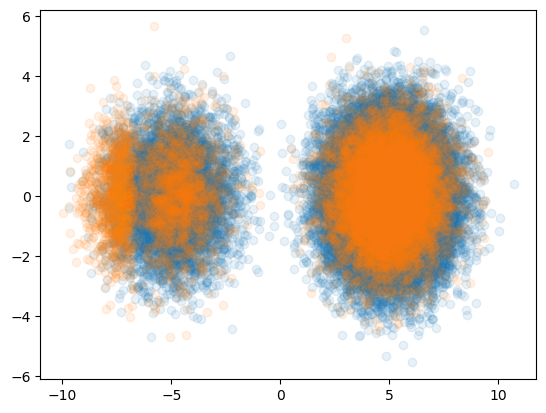

In [44]:
plt.scatter(X[:, -1, 0], X[:, -1, 1], alpha=0.1)
plt.scatter(X_lam_15[:, -1, 0], X_lam_15[:, -1, 1], alpha=0.1)
# plt.scatter(X_lam_8[:, -1, 0], X_lam_8[:, -1, 1], alpha=0.1)

# plt.scatter(X_chern[:, -1, 0], X_chern[:,-1, 1], alpha=0.1)

In [20]:
from guided_models import GuidedDiffusion
guided_per = GuidedDiffusion(dist0, alpha_t, lambda x, t: np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B)), upper_bound=B, temperature=1, S=10_000)
X_per = guided_per.calc_samples()


Reverse Diffusion Progress: 100%|██████████| 19/19 [02:09<00:00,  6.84s/it]


In [21]:
B = 3
k = 2
L_r = B*k/4
from mixture_guidance import MixtureSpecificGuidance
diffusion_msg = MixtureSpecificGuidance(dist0, alpha_t, reward_func_hard, L_r = L_r, value_fn=lambda t, x: (np.log(np.clip(val_ensemble.predict(x, t), np.e**(-B), np.e**B))),   S = 10_000, delta = 0.01, use_trace = False)
X_msg = diffusion_msg.calc_samples()

Mixture reverse: 100%|██████████| 19/19 [00:53<00:00,  2.83s/it]


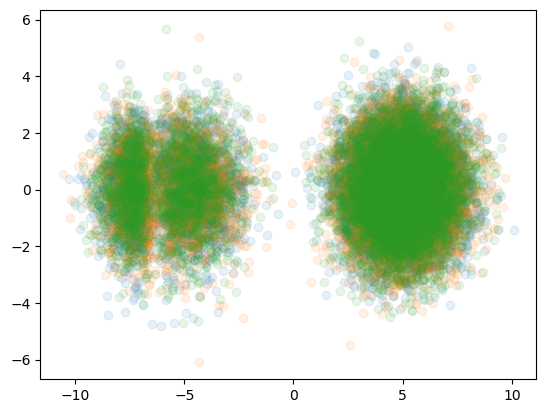

In [22]:
plt.scatter(X_per[:, -1, 0], X_per[:, -1, 1], alpha=0.1)
plt.scatter(X_msg[:, -1, 0], X_msg[:, -1, 1], alpha=0.1)
plt.scatter(X_train[:, -1, 0], X_train[:, -1, 1], alpha=0.1)


In [217]:
X_train.shape

(10000, 20, 2)

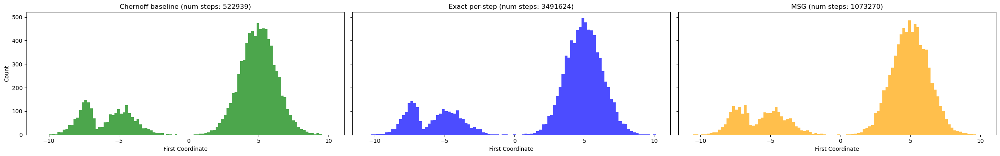

In [23]:
fig, axs = plt.subplots(1, 3, figsize=(25, 4), sharex=True, sharey=True)

axs[0].hist(X_train[:, -1, 0], bins=100, alpha=0.7, color='green')
axs[0].set_title('Chernoff baseline (num steps: {})'.format(chernoff_guided.num_steps))
axs[0].set_xlabel('First Coordinate')
axs[0].set_ylabel('Count')

axs[1].hist(X_per[:, -1, 0], bins=100, alpha=0.7, color='blue')
axs[1].set_title('Exact per-step (num steps: {})'.format(guided_per.num_steps))
axs[1].set_xlabel('First Coordinate')

axs[2].hist(X_msg[:, -1, 0], bins=100, alpha=0.7, color='orange')
axs[2].set_title('MSG (num steps: {})'.format(diffusion_msg.num_steps))
axs[2].set_xlabel('First Coordinate')


plt.tight_layout()
plt.show()

In [24]:
chernoff_guided.num_steps

522939

In [25]:
diffusion_msg.num_steps

1073270

In [26]:
guided_per.num_steps

3491624

In [27]:
chernoff_guided.taus

array([-0.17712995,  0.00228691,  0.11867516,  0.21358007,  0.3095727 ,
        0.38598618,  0.58430189,  0.90883893,  1.33712792,  0.67028588,
        0.86582762,  0.83863193,  1.02824128,  1.09259272,  1.21093237,
        0.741301  ,  1.36678827,  1.36399651,  0.82568669])

In [28]:
bl = chernoff_guided.baseline

In [29]:
def visualize_baseline_2d(baseline, t_scalar, grid_size=100, value_range=(-3, 3)):
        """
        Visualizes log u_{t+1}(y_{t+1}) over a 2D grid for d=2.
        Args:
            baseline: LogUBaselineNet instance
            t_scalar: time index (int)
            grid_size: number of points per axis
            value_range: tuple (min, max) for each axis
        """
        import matplotlib.pyplot as plt

        if baseline.d != 2:
            raise ValueError("Visualization only supported for d=2.")

        x = np.linspace(value_range[0], value_range[1], grid_size)
        y = np.linspace(value_range[0], value_range[1], grid_size)
        xx, yy = np.meshgrid(x, y)
        grid = np.stack([xx.ravel(), yy.ravel()], axis=1)  # (grid_size^2, 2)

        with torch.no_grad():
            grid_tensor = torch.tensor(grid, dtype=torch.float32, device=baseline.device)
            logu = baseline(grid_tensor, t_scalar).cpu().numpy().reshape(grid_size, grid_size)

        plt.figure(figsize=(6, 5))
        plt.imshow(logu, extent=(value_range[0], value_range[1], value_range[0], value_range[1]),
                   origin='lower', aspect='auto', cmap='viridis')
        plt.colorbar(label='log u')
        plt.title(f"log u_{{t+1}}(y_{{t+1}}), t={t_scalar}")
        plt.xlabel("y1")
        plt.ylabel("y2")
        plt.show()

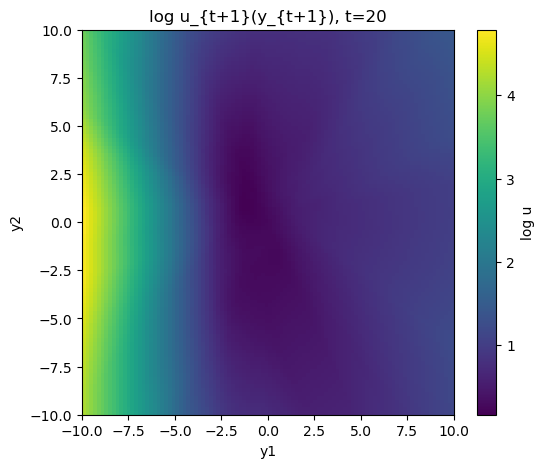

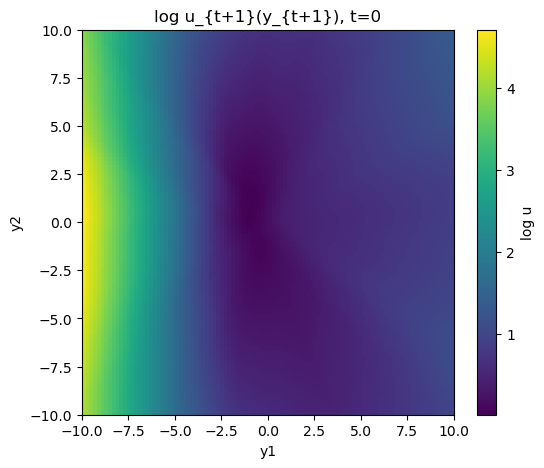

In [30]:
visualize_baseline_2d(bl, 20, grid_size=100, value_range=(-10, 10))
visualize_baseline_2d(bl, 0, grid_size=100, value_range=(-10, 10))

In [31]:
chernoff_guided.lambdas

array([15.18690305, 15.19415574, 15.19716458, 15.19543176, 15.1902514 ,
       15.17784505, 15.15577321, 15.10103803, 15.0971394 , 15.09531979,
       15.07934384, 15.07953648, 15.08602528, 15.0941935 , 15.11132531,
       15.12740044, 15.14209847, 15.16001325, 15.1876183 ])